# Effectiveness of Covid-19 management and preventative measures in Ontario, Canada.
> "An analysis of how Ontario's covid-19 eradication strategy compares to it's reality."

- toc: true
- branch: master
- badges: true
- comments: true
- author: Enobong Udoh
- categories: [Covid-19, Ontario, Canada]
- image: images/project_thumbnails/ontario_covid.png
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2



## Project motivation and background

Covid-19 is an infectious respiratory diseases caused by the newly discovered Coronavirus. The novel virus, also known as SARS-CoV-2 (severe acute respiratory syndrome coronavirus 2, formerly called 2019-nCoV), is a family of viruses popularized by their spiky crown. The virus was first detected amid an outbreak of respiratory illness cases in Wuhan City, China and was initially reported by World Health Organization on the 31st of December 2019.
    
In this work, exploratory analysis is carried out to assess the impact of Ontario's Covid preventative solutions and restrictive measures (mobility), on the daily changes in covid cases.  

In particular, this project will explore the following lines of inquiry with the help of a number of publicly accessible data sets: 

1. Is there an observable relationship between the reported covid activities and the proposed medical solution i.e. vaccination?

2. Is there an influence on the number of reported cases in ontario by people's activities across the days of the week?

3. With the government's vaccination plan, preference was given to adults who were 70 and over first, as well as those considered medically compromised. Was this as a result of the significance in the number of confirmed positive cases in the age group 70 and above?

4. How does the proportion of affected groups compare with the those getting vaccinated?

5. How has the pandemic impacted the community's mobility?  Is there an observable effect on the number of cases in the province?

## Data collection

The following datasets were identified to fulfill the analysis requirement: 

1. Ontario's Covid-19 Pandemic and Vaccination trends from 25-January-2020 to 17-July-2021
  - [Data Source](https://covid19tracker.ca/vaccinationtracker.html) 

2. Confirmed Positive Cases in cities within Ontario (with age)
  - [Data Source](https://data.ontario.ca/dataset/confirmed-positive-cases-of-covid-19-in-ontario)
  - [Data Dictionary](https://data.ontario.ca/dataset/confirmed-positive-cases-of-covid-19-in-ontario)

3. Ontario Vaccination data (by age)
  - [Data Source](https://data.ontario.ca/en/dataset/covid-19-vaccine-data-in-ontario/resource/775ca815-5028-4e9b-9dd4-6975ff1be021)  
  - [Data Dictionary](https://data.ontario.ca/en/dataset/covid-19-vaccine-data-in-ontario)

4. Google Covid-19 mobility report
  - [Data Source](https://www.google.com/covid19/mobility/)
  - [Data Dictionary](https://www.google.com/covid19/mobility/data_documentation.html?hl=en)
    Note: The baseline in mobility data is the median value, for the corresponding day of the week, during the 5-week period Jan 3–Feb 6, 2020
---

## Data understanding

Features Explored In Ontario's Covid-19 Pandemic and Vaccination trends from 25-January-2020 to 17-July-2021:

1. `date` - The date of activities captured in the dataset
2. `change_cases` - The number of new cases as of each day
3. `change_fatalities` - The number of new hospitalizations as of each day
4. `change_tests` - The number of new tests as of each day
5. `change_hospitalizations` - The number of new hospitalizations as of each day
6. `change_criticals` - The number of new critcal cases as of each day
7. `change_recoveries` - The number of recovered patients as of each day
8. `change_vaccinations` - The number of new single-dosed vaccinated people as of each day
9. `change_vaccinated` - The number of fully vaccinated people as of each day
10. `change_vaccines_distributed` - The number of vaccines made available to the province as of each day
11. `total_cases` - Total number of covid cases 
12. `total_fatalities` - Total number of covid-related fatalities 
13. `total_tests` - Total number of covid tests 
14. `total_hospitalizations` - Total number of covid-related hospitalizations 
15. `total_critcals` - Total number of covid-related critical care patients
16. `total_recoveries` - Total number of recoveries
17. `total_vaccinations` - Total number of covid vaccinations (first dose)
18. `total_vaccinated` - Total number of fully vaccinated people
19. `total_vaccines_distributed` - Total number of vaccines distributed across the province


**NOTE:** Other Datasets used are accompanied with links to their dictionaries above.

<br>



## Importing project dependencies

---
Required libraries are:

1. ` pandas` : required to access dataset .csv file and work with data in tabular representation.

2. ` numpy` required to round the data in the correlation matrix.

3. ` matplotlib, seaborn, pylab` required for data visualization. 

4. ` missingno`, used to understand and visualize the prsence and distribution of missing values in data

5. ` Datetime`, used to work with time series data

6. ` pandas_profiling and pandas_profiling.utils.cache`, used as a guiding tool to profile date

7. `sklearn`: This library was used to access machine learning modules for prediction-related tasks.


In [ ]:
# installing pandas profiling
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

In [2]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import missingno
import mpl_toolkits.mplot3d as m3d
import seaborn as sns
import matplotlib
from pylab import *
from pylab import rcParams
import pandas_profiling
from pandas_profiling import ProfileReport
from pandas_profiling.utils.cache import cache_file
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error


In [3]:
# verifying numpy and pandas version being used
print(f"numpy version: {np.__version__}")
print(f"pandas version: {pd.__version__}")
print(f"pandas profiling version: {pandas_profiling.__version__}") 

numpy version: 1.19.5
pandas version: 1.1.5
pandas profiling version: 3.0.0


## Utility functions

The following utility functions are used to support exploratory data analysis work. 

In [ ]:
'''
Searching for percentage of missing data in each column
'''
def precent_na_in_cols(df):
  for items in df.columns:
    missingvaluecheck = df[items].isnull().mean()
    print(f"{items} - {missingvaluecheck :.1%}")

In [ ]:
'''
quick duplicate search for entire df with response
'''
def dup_quick_search(df):
  if df.duplicated().any()==True:
    print('There are some duplicates')
  else:
    print('There are no duplicates')
    


In [ ]:
'''
duplicate search for non-numeric columns in df with response

'''
def non_num_dup_search(df):
  non_number_columns = list(df.select_dtypes(exclude=('int', 'float')).columns)
  print(f'Columns without numeric data: {", ".join(non_number_columns)}.')

  for column in non_number_columns:
    if df[column].duplicated().any()==True:
      print(f'The duplicate columns are {column}')
    else:
      print('There are no duplicate columns in this data')

In [ ]:
'''
Search function for finding highest incident value in a column - with date and day
'''
def singleCol_highest_search(df, args):
   last_col = df.columns[-1]
   print(f"The table below shows the date of the highest number of {args}\n\n")
   return df[df[args]==df[args].max()][[args,last_col]]



## Data preparation

In this section, data will be imported and exploratory data analysis will be carried out. Data types, missing values, duplicates, measures of the central trend, and also the relationship between variables will be described.

### A. Ontario Covid and Vaccine data

Data types

In [ ]:
# reading the data from CSV file
ontariocovid_vaccine_raw_df = pd.read_csv('OntarioDS.csv')

In [ ]:
# Accessing the first few rows of the dataset to see datatypes
ontariocovid_vaccine_raw_df.head(2)

,province,last_updated,data » date,data » change_cases,data » change_fatalities,data » change_tests,data » change_hospitalizations,data » change_criticals,data » change_recoveries,data » change_vaccinations,data » change_vaccinated,data » change_vaccines_distributed,data » total_cases,data » total_fatalities,data » total_tests,data » total_hospitalizations,data » total_criticals,data » total_recoveries,data » total_vaccinations,data » total_vaccinated,data » total_vaccines_distributed
0,on,2021-07-17 8:26:38,2020-01-25,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,NaN,NaN,2020-01-26,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0


In [ ]:
# reviewing the columns in the data
ontariocovid_vaccine_raw_df.columns

Index(['province', 'last_updated', 'data » date', 'data » change_cases',
       'data » change_fatalities', 'data » change_tests',
       'data » change_hospitalizations', 'data » change_criticals',
       'data » change_recoveries', 'data » change_vaccinations',
       'data » change_vaccinated', 'data » change_vaccines_distributed',
       'data » total_cases', 'data » total_fatalities', 'data » total_tests',
       'data » total_hospitalizations', 'data » total_criticals',
       'data » total_recoveries', 'data » total_vaccinations',
       'data » total_vaccinated', 'data » total_vaccines_distributed'],
      dtype='object')

In [ ]:
# verifying data types
ontariocovid_vaccine_raw_df.dtypes

province                              object
last_updated                          object
data » date                           object
data » change_cases                    int64
data » change_fatalities               int64
data » change_tests                    int64
data » change_hospitalizations         int64
data » change_criticals                int64
data » change_recoveries               int64
data » change_vaccinations             int64
data » change_vaccinated               int64
data » change_vaccines_distributed     int64
data » total_cases                     int64
data » total_fatalities                int64
data » total_tests                     int64
data » total_hospitalizations          int64
data » total_criticals                 int64
data » total_recoveries                int64
data » total_vaccinations              int64
data » total_vaccinated                int64
data » total_vaccines_distributed      int64
dtype: object

In [ ]:
# getting the size and shape of the data
print(f"The size of the raw ontario covid and vaccince data is {ontariocovid_vaccine_raw_df.size}")
print(f"The shape of the raw ontario covid and vaccince data is {ontariocovid_vaccine_raw_df.shape}")

The size of the raw ontario covid and vaccince data is 11340
The shape of the raw ontario covid and vaccince data is (540, 21)


**`Observation:`**
- Column names are lengthy and can be simplified
- The date column is of the wrong data type
- Raw data contains some columns that are not needed for this analysis

Data cleaning

In [ ]:
# dropping the columns not used in the project
ontariocovid_vaccine_raw_df.drop(columns=['province','last_updated'], axis=1, inplace=True, errors='raise')

# reviewing data to see result without dropped columns
ontariocovid_vaccine_raw_df.head(3)

,data » date,data » change_cases,data » change_fatalities,data » change_tests,data » change_hospitalizations,data » change_criticals,data » change_recoveries,data » change_vaccinations,data » change_vaccinated,data » change_vaccines_distributed,data » total_cases,data » total_fatalities,data » total_tests,data » total_hospitalizations,data » total_criticals,data » total_recoveries,data » total_vaccinations,data » total_vaccinated,data » total_vaccines_distributed
0,2020-01-25,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,2020-01-26,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0
2,2020-01-27,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0


In [ ]:
# creating a clean version of the df renaming columns for ease and clarity
ontariocovid_vaccine_cl_df = ontariocovid_vaccine_raw_df.rename(columns={'data » date':'date','data » change_cases': 'change_cases','data » change_fatalities':'change_fatalities','data » change_tests':'change_tests','data » change_hospitalizations':'change_hospitalizations','data » change_criticals':'change_criticals','data » change_recoveries':'change_recoveries','data » change_vaccinations':'change_vaccinations','data » change_vaccinated':'change_vaccinated','data » change_vaccines_distributed':'change_vaccines_distributed','data » total_cases':'total_cases','data » total_fatalities':'total_fatalities','data » total_tests':'total_tests','data » total_hospitalizations':'total_hospitalizations','data » total_criticals':'total_criticals','data » total_recoveries':'total_recoveries','data » total_vaccinations':'total_vaccinations','data » total_vaccinated':'total_vaccinated','data » total_vaccines_distributed':'total_vaccines_distibuted'})

# reviewing table with renamed columns
ontariocovid_vaccine_cl_df.head(2)

,date,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
0,2020-01-25,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,2020-01-26,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0


In [ ]:
# Let's look at the dimension of the data
print(f"shape: {ontariocovid_vaccine_cl_df.shape}")
print(f"size: {ontariocovid_vaccine_cl_df.size}")

shape: (540, 19)
size: 10260


In [ ]:
# Deducing the data types to ensure python has captured things correctly
ontariocovid_vaccine_cl_df.dtypes

date                           object
change_cases                    int64
change_fatalities               int64
change_tests                    int64
change_hospitalizations         int64
change_criticals                int64
change_recoveries               int64
change_vaccinations             int64
change_vaccinated               int64
change_vaccines_distributed     int64
total_cases                     int64
total_fatalities                int64
total_tests                     int64
total_hospitalizations          int64
total_criticals                 int64
total_recoveries                int64
total_vaccinations              int64
total_vaccinated                int64
total_vaccines_distibuted       int64
dtype: object

In [ ]:
# Since the date columns was captured as an object, convert to python date type 
ontariocovid_vaccine_cl_df['date'] = pd.to_datetime(ontariocovid_vaccine_cl_df['date'])   # alternative method: OntarioDS['Date'].astype('datetime64')
ontariocovid_vaccine_cl_df.tail(2)

,date,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
538,2021-07-16,159,10,28126,-6,-10,189,168616,148190,0,547864,9285,16310438,159,158,537176,17810472,7578116,21247191
539,2021-07-17,176,3,0,-16,-9,203,169103,148713,0,548040,9288,16310438,143,149,537379,17979575,7726829,21247191


In [ ]:
# verifying data types
ontariocovid_vaccine_cl_df.dtypes

date                           datetime64[ns]
change_cases                            int64
change_fatalities                       int64
change_tests                            int64
change_hospitalizations                 int64
change_criticals                        int64
change_recoveries                       int64
change_vaccinations                     int64
change_vaccinated                       int64
change_vaccines_distributed             int64
total_cases                             int64
total_fatalities                        int64
total_tests                             int64
total_hospitalizations                  int64
total_criticals                         int64
total_recoveries                        int64
total_vaccinations                      int64
total_vaccinated                        int64
total_vaccines_distibuted               int64
dtype: object

Missing values

In [ ]:
# Checking data information to see if there are any columns with missing data
ontariocovid_vaccine_cl_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 540 entries, 0 to 539
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   date                         540 non-null    datetime64[ns]
 1   change_cases                 540 non-null    int64         
 2   change_fatalities            540 non-null    int64         
 3   change_tests                 540 non-null    int64         
 4   change_hospitalizations      540 non-null    int64         
 5   change_criticals             540 non-null    int64         
 6   change_recoveries            540 non-null    int64         
 7   change_vaccinations          540 non-null    int64         
 8   change_vaccinated            540 non-null    int64         
 9   change_vaccines_distributed  540 non-null    int64         
 10  total_cases                  540 non-null    int64         
 11  total_fatalities             540 non-null    

In [ ]:
# while the above showed the not-null count, 
# data was double-checked by calculating the percentage of blanks and filled values for each column
precent_na_in_cols(ontariocovid_vaccine_cl_df)

date - 0.0%
change_cases - 0.0%
change_fatalities - 0.0%
change_tests - 0.0%
change_hospitalizations - 0.0%
change_criticals - 0.0%
change_recoveries - 0.0%
change_vaccinations - 0.0%
change_vaccinated - 0.0%
change_vaccines_distributed - 0.0%
total_cases - 0.0%
total_fatalities - 0.0%
total_tests - 0.0%
total_hospitalizations - 0.0%
total_criticals - 0.0%
total_recoveries - 0.0%
total_vaccinations - 0.0%
total_vaccinated - 0.0%
total_vaccines_distibuted - 0.0%


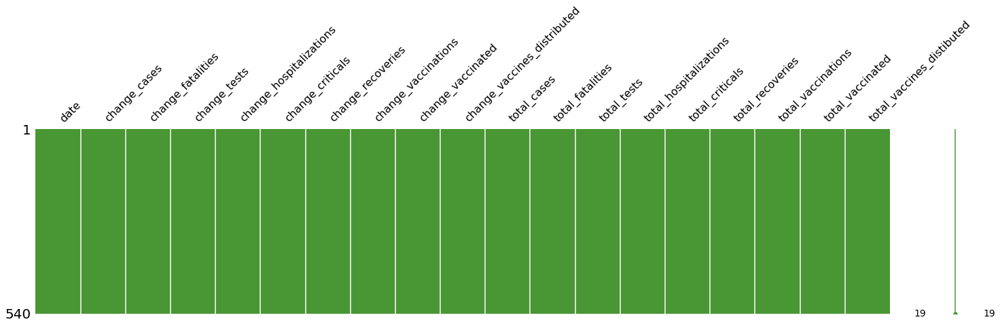

In [ ]:
# Visualizing the missing data in the dataset
missingno.matrix(ontariocovid_vaccine_cl_df,fontsize=16,figsize=(25,5),color=(0.29,0.5908,0.21))  #width and height in inches
plt.show()

**`Conclusion:`** The data has no missing values so no further transformations are required

Checking for Outliers

In [ ]:
# describing the data to review the min, max and deviation from the mean to see if there are outliers
ontariocovid_vaccine_cl_df.describe()
 

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
count,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,540.000000,5.400000e+02,540.000000,540.000000,5.400000e+02,540.000000,540.000000,540.000000,5.400000e+02,5.400000e+02,5.400000e+02
mean,1014.888889,17.200000,30204.514815,0.264815,0.275926,995.146296,33295.509259,14308.942593,3.934665e+04,173438.322222,4102.418519,6.210089e+06,607.118519,233.716667,159704.788889,1.891873e+06,4.053989e+05,2.228826e+06
std,1121.017676,18.354194,19587.605552,57.839762,11.191029,1097.000888,62197.435746,44979.114900,1.846978e+05,187762.934298,2938.819561,5.565973e+06,569.154860,224.955084,179204.821849,4.092870e+06,1.257577e+06,4.784855e+06
min,0.000000,-1.000000,-725.000000,-366.000000,-34.000000,0.000000,0.000000,0.000000,0.000000e+00,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00
25%,164.750000,3.000000,16302.500000,-14.000000,-4.000000,162.250000,0.000000,0.000000,0.000000e+00,30799.250000,2444.000000,8.630498e+05,106.500000,45.750000,24432.000000,0.000000e+00,0.000000e+00,0.000000e+00
50%,488.000000,12.000000,28713.500000,0.000000,0.000000,501.500000,0.000000,0.000000,0.000000e+00,66291.000000,3057.500000,4.730649e+06,520.500000,191.000000,56965.500000,0.000000e+00,0.000000e+00,0.000000e+00
75%,1588.000000,25.000000,44742.000000,15.000000,3.000000,1536.500000,28096.500000,1929.500000,0.000000e+00,305069.500000,7029.500000,1.124538e+07,919.500000,335.000000,287713.750000,7.937995e+05,2.683542e+05,1.086745e+06
max,4812.000000,100.000000,76472.000000,405.000000,167.000000,4698.000000,268884.000000,244701.000000,2.106190e+06,548040.000000,9288.000000,1.631044e+07,2360.000000,900.000000,537379.000000,1.797958e+07,7.726829e+06,2.124719e+07


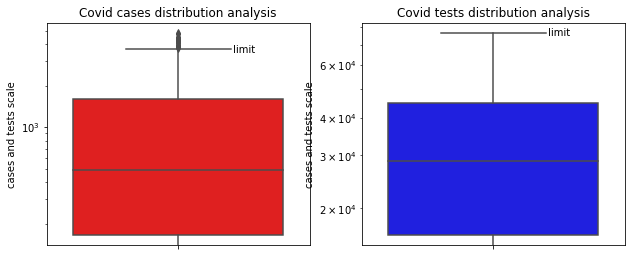

In [ ]:
fig_2 = plt.figure(figsize=(16,9))
gridspec.GridSpec(2,3)

plt.subplot2grid((2,3),(0,0))
# using a box plot to get a clearer view on possible ouliers
# plt.figure(figsize=(5,5))
sns.boxplot(y='change_cases', data=ontariocovid_vaccine_cl_df, color='red')
plt.title("Covid cases distribution analysis")
plt.annotate("limit",(.21,10**3.54))
plt.yscale('log') 
plt.ylabel("cases and tests scale")

plt.subplot2grid((2,3),(0,1))
sns.boxplot(y='change_tests', data=ontariocovid_vaccine_cl_df, color='blue')
plt.title("Covid tests distribution analysis")
plt.annotate("limit",(.21,10**4.875))
plt.yscale('log') 
plt.ylabel("cases and tests scale")

plt.show()

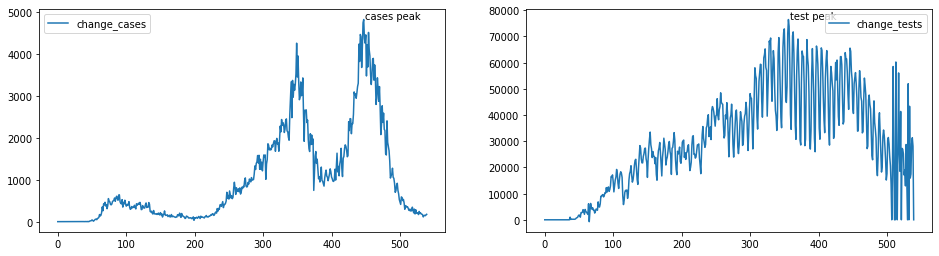

In [ ]:
# checking to see if the outliers are random or there was a trend
fig_1 = plt.figure(figsize=(16,9))
gridspec.GridSpec(2,3)

plt.subplot2grid((2,2),(0,0))
# plt.figure(figsize=(5,5))
ontariocovid_vaccine_cl_df['change_cases'].plot()
plt.annotate("cases peak",(449,4812))
plt.legend()

plt.subplot2grid((2,2),(0,1))
# plt.figure(figsize=(5,5))
ontariocovid_vaccine_cl_df['change_tests'].plot()
plt.annotate("test peak",(358,76472),xycoords ='data')
# plt.annotate("test peak",(370,76472),xycoords ='data' ,arrowprops=dict(arrowstyle="->",color='black', shrink=0.0001, headwidth = 0.01,width=0.1))
plt.legend()
plt.show()


**`Conclusion:`**

- The data description indicates that there are significant deviations from the mean and the box plot shows that there are possible outliers in the dataset
- Using a line plot, it can be observed that there was a lot of fluctuation in activities throughout the period.
- To further validate that the numbers are not a result of data error, with the information captured on [CTV news](https://toronto.ctvnews.ca/ontario-breaks-daily-covid-19-record-again-with-more-than-4-800-new-cases-1.5390144) and Ontario's covid tracker, where the dataset was extracted from, the fluctuation in the events hold true.
- No further transformation required

Duplicated data

In [ ]:
# checking for duplicates method 1
dup_quick_search(ontariocovid_vaccine_cl_df)

In [ ]:
# checking for duplicates method 2
non_num_dup_search(ontariocovid_vaccine_cl_df)

Columns without numeric data: date.
There are no duplicate columns in this data


**`Conclusion:`** 
- While there's a non-numeric column - Date, it contains no duplicated data, so no further transformation required

Setting new index - time series

In [ ]:
# setting Date column as index post-cleaning and creating a new dataframe variable to hold this
ontariocovid_vaccine_ts_df = ontariocovid_vaccine_cl_df.set_index('date').tz_localize("Canada/Eastern")
ontariocovid_vaccine_ts_df.index.names =[None]        # removing index column name
ontariocovid_vaccine_ts_df.head()

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
2020-01-25 00:00:00-05:00,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2020-01-26 00:00:00-05:00,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0
2020-01-27 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0
2020-01-28 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0
2020-01-29 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0


In [ ]:
# getting information on the timeseries version of the Ontario Data set - reviewing columns and null values
ontariocovid_vaccine_ts_df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 540 entries, 2020-01-25 00:00:00-05:00 to 2021-07-17 00:00:00-04:00
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype
---  ------                       --------------  -----
 0   change_cases                 540 non-null    int64
 1   change_fatalities            540 non-null    int64
 2   change_tests                 540 non-null    int64
 3   change_hospitalizations      540 non-null    int64
 4   change_criticals             540 non-null    int64
 5   change_recoveries            540 non-null    int64
 6   change_vaccinations          540 non-null    int64
 7   change_vaccinated            540 non-null    int64
 8   change_vaccines_distributed  540 non-null    int64
 9   total_cases                  540 non-null    int64
 10  total_fatalities             540 non-null    int64
 11  total_tests                  540 non-null    int64
 12  total_hospitalizations       540 non-null    int64
 13  t

In [ ]:
# verifying time series data shape
print(f'The Shape of the time series version of the data frame is: \t{ontariocovid_vaccine_ts_df.shape}')
print(f'The Size of the time series version of the data frame is: \t{ontariocovid_vaccine_ts_df.size}')

The Shape of the time series version of the data frame is: 	(540, 18)
The Size of the time series version of the data frame is: 	9720


**`Conclusion: `**
- Ontario covid and vaccine time series data has been cleaned, converted to timeseries with Canada/Eastern timezone and is ready for processsing.

**`PROFILING TEST`**

In [ ]:
# getting the pandas profile of primary dataset
profile = ProfileReport(ontariocovid_vaccine_ts_df, title="Ontario_Covid_Vaccine", html={'style': {'full_width': True}}, sort=None)
profile.to_widgets()

In [ ]:
# profile.to_file("ontario_df_profile_report.html")

In [ ]:
# another way of displaying report
# profile

### B. Ontario confirmed positive cases with age groups

Data types

In [ ]:
# get the data and sort by Cases_Reported_Date
confirmed_cases_city_raw_df = pd.read_csv('confirmed_positive_cases_of_COVID19_in_Ontario.csv')
confirmed_cases_city_raw_df.sort_values(by='Case_Reported_Date', inplace=True)
confirmed_cases_city_raw_df.head(10)

,_id,Row_ID,Accurate_Episode_Date,Case_Reported_Date,Test_Reported_Date,Specimen_Date,Age_Group,Client_Gender,Case_AcquisitionInfo,Outcome1,Outbreak_Related,Reporting_PHU_ID,Reporting_PHU,Reporting_PHU_Address,Reporting_PHU_City,Reporting_PHU_Postal_Code,Reporting_PHU_Website,Reporting_PHU_Latitude,Reporting_PHU_Longitude
10,11,11,2020-01-21T00:00:00,2020-01-23T00:00:00,2020-01-26T00:00:00,2020-01-23T00:00:00,50s,MALE,TRAVEL,Resolved,NaN,3895,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2,www.toronto.ca/community-people/health-wellnes...,43.656591,-79.379358
11,12,12,2020-01-22T00:00:00,2020-01-23T00:00:00,2020-01-27T00:00:00,2020-01-25T00:00:00,50s,FEMALE,TRAVEL,Resolved,NaN,3895,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2,www.toronto.ca/community-people/health-wellnes...,43.656591,-79.379358
13,14,14,2020-01-24T00:00:00,2020-01-24T00:00:00,2020-02-04T00:00:00,2020-01-24T00:00:00,20s,FEMALE,TRAVEL,Resolved,NaN,2244,Middlesex-London Health Unit,50 King Street,London,N6A 5L7,www.healthunit.com,42.981468,-81.254016
20,21,21,2020-02-05T00:00:00,2020-02-21T00:00:00,2020-02-24T00:00:00,2020-02-22T00:00:00,20s,FEMALE,TRAVEL,Resolved,NaN,3895,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2,www.toronto.ca/community-people/health-wellnes...,43.656591,-79.379358
26,27,27,2020-02-16T00:00:00,2020-02-25T00:00:00,2020-02-25T00:00:00,2020-02-25T00:00:00,60s,FEMALE,TRAVEL,Resolved,NaN,3895,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2,www.toronto.ca/community-people/health-wellnes...,43.656591,-79.379358
30,31,31,2020-02-20T00:00:00,2020-02-26T00:00:00,2020-02-27T00:00:00,2020-02-26T00:00:00,60s,MALE,TRAVEL,Resolved,NaN,3895,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2,www.toronto.ca/community-people/health-wellnes...,43.656591,-79.379358
50,51,51,2020-02-25T00:00:00,2020-02-27T00:00:00,2020-02-28T00:00:00,2020-02-27T00:00:00,30s,FEMALE,OB,Resolved,NaN,2270,York Region Public Health Services,17250 Yonge Street,Newmarket,L3Y 6Z1,www.york.ca/wps/portal/yorkhome/health/,44.048023,-79.480239
46,47,47,2020-02-24T00:00:00,2020-02-27T00:00:00,2020-02-27T00:00:00,2020-02-27T00:00:00,50s,MALE,TRAVEL,Resolved,NaN,3895,Toronto Public Health,"277 Victoria Street, 5th Floor",Toronto,M5B 1W2,www.toronto.ca/community-people/health-wellnes...,43.656591,-79.379358
55,56,56,2020-02-27T00:00:00,2020-02-28T00:00:00,2020-03-02T00:00:00,2020-02-28T00:00:00,50s,MALE,OB,Resolved,NaN,2270,York Region Public Health Services,17250 Yonge Street,Newmarket,L3Y 6Z1,www.york.ca/wps/portal/yorkhome/health/,44.048023,-79.480239
53,54,54,2020-02-26T00:00:00,2020-02-28T00:00:00,2020-02-28T00:00:00,2020-02-28T00:00:00,60s,MALE,CC,Resolved,NaN,2230,Durham Region Health Department,605 Rossland Road East,Whitby,L1N 0B2,www.durham.ca/en/health-and-wellness/health-an...,43.898605,-78.940341


In [ ]:
# verifying columns
confirmed_cases_city_raw_df.columns

Index(['_id', 'Row_ID', 'Accurate_Episode_Date', 'Case_Reported_Date',
       'Test_Reported_Date', 'Specimen_Date', 'Age_Group', 'Client_Gender',
       'Case_AcquisitionInfo', 'Outcome1', 'Outbreak_Related',
       'Reporting_PHU_ID', 'Reporting_PHU', 'Reporting_PHU_Address',
       'Reporting_PHU_City', 'Reporting_PHU_Postal_Code',
       'Reporting_PHU_Website', 'Reporting_PHU_Latitude',
       'Reporting_PHU_Longitude'],
      dtype='object')

In [ ]:
# verifying data types
confirmed_cases_city_raw_df.dtypes

_id                            int64
Row_ID                         int64
Accurate_Episode_Date         object
Case_Reported_Date            object
Test_Reported_Date            object
Specimen_Date                 object
Age_Group                     object
Client_Gender                 object
Case_AcquisitionInfo          object
Outcome1                      object
Outbreak_Related              object
Reporting_PHU_ID               int64
Reporting_PHU                 object
Reporting_PHU_Address         object
Reporting_PHU_City            object
Reporting_PHU_Postal_Code     object
Reporting_PHU_Website         object
Reporting_PHU_Latitude       float64
Reporting_PHU_Longitude      float64
dtype: object

In [ ]:
# getting the size and shape of the data
print(f"The size of the raw confirmed cases with age groups data is {confirmed_cases_city_raw_df.size}")
print(f"The shape of the raw confirmed cases with age groups data is {confirmed_cases_city_raw_df.shape}")

The size of the raw confirmed cases with age groups data is 10525278
The shape of the raw confirmed cases with age groups data is (553962, 19)


**`Observations:`**
- Data contains multiple columns that seem to be indices
- Data is captured from multiple cities and need to be grouped by the `date`, `age_groups` and `gender` to make it a cummulative Ontario data for this analysis.
- Column names are capitalized and can be made lower case for consistency (not mandatory)
- Some columns are of the wrong data type
- Raw data contains some columns that are not needed for this analysis
- Records need to be adjusted to match target eda end date July 17

Data cleaning

In [ ]:
# making an Ontario confirmed cases data frame from the confirmed cases in each city
# fiirst - copy the city raw df for modification
ont_confirmed_cases_raw_df = confirmed_cases_city_raw_df.copy()

In [ ]:
# setting a case count column to capture each cases numerically
ont_confirmed_cases_raw_df['case_count'] =1
  
ont_confirmed_cases_raw_df.tail(2)

,_id,Row_ID,Accurate_Episode_Date,Case_Reported_Date,Test_Reported_Date,Specimen_Date,Age_Group,Client_Gender,Case_AcquisitionInfo,Outcome1,Outbreak_Related,Reporting_PHU_ID,Reporting_PHU,Reporting_PHU_Address,Reporting_PHU_City,Reporting_PHU_Postal_Code,Reporting_PHU_Website,Reporting_PHU_Latitude,Reporting_PHU_Longitude,case_count
553730,553731,553731,2021-08-09T00:00:00,2021-08-11T00:00:00,2021-08-11T00:00:00,2021-08-09T00:00:00,20s,MALE,OB,Not Resolved,Yes,2270,York Region Public Health Services,17250 Yonge Street,Newmarket,L3Y 6Z1,www.york.ca/wps/portal/yorkhome/health/,44.048023,-79.480239,1
553961,553962,553962,2021-08-11T00:00:00,2021-08-11T00:00:00,2021-08-11T00:00:00,2021-08-11T00:00:00,<20,MALE,MISSING INFORMATION,Not Resolved,NaN,2270,York Region Public Health Services,17250 Yonge Street,Newmarket,L3Y 6Z1,www.york.ca/wps/portal/yorkhome/health/,44.048023,-79.480239,1


In [ ]:
# quick duplicate check search before grouping the data for ontario
ont_confirmed_cases_raw_df.duplicated().any()

False

In [ ]:
# quick null search before grouping data for ontario
ont_confirmed_cases_raw_df.isnull().any()

_id                          False
Row_ID                       False
Accurate_Episode_Date        False
Case_Reported_Date           False
Test_Reported_Date            True
Specimen_Date                 True
Age_Group                    False
Client_Gender                False
Case_AcquisitionInfo         False
Outcome1                     False
Outbreak_Related              True
Reporting_PHU_ID             False
Reporting_PHU                False
Reporting_PHU_Address        False
Reporting_PHU_City           False
Reporting_PHU_Postal_Code    False
Reporting_PHU_Website        False
Reporting_PHU_Latitude       False
Reporting_PHU_Longitude      False
case_count                   False
dtype: bool

In [ ]:
# investigating percentage of missing data in the columns 
for cols in ont_confirmed_cases_raw_df.columns:
  missingvaluecheck = ont_confirmed_cases_raw_df[cols].isnull().mean()
  print(f"{cols} - {missingvaluecheck :.1%}")

_id - 0.0%
Row_ID - 0.0%
Accurate_Episode_Date - 0.0%
Case_Reported_Date - 0.0%
Test_Reported_Date - 2.3%
Specimen_Date - 0.4%
Age_Group - 0.0%
Client_Gender - 0.0%
Case_AcquisitionInfo - 0.0%
Outcome1 - 0.0%
Outbreak_Related - 82.8%
Reporting_PHU_ID - 0.0%
Reporting_PHU - 0.0%
Reporting_PHU_Address - 0.0%
Reporting_PHU_City - 0.0%
Reporting_PHU_Postal_Code - 0.0%
Reporting_PHU_Website - 0.0%
Reporting_PHU_Latitude - 0.0%
Reporting_PHU_Longitude - 0.0%
case_count - 0.0%


**`Observations:`**
- There are no duplicated records in the confirmed positive cases for the cities in Ontario.
- However, some columns have missing values. Since these columns are not used in the analysis and don't hold crucial data, grouping process would continue without further transformation

In [ ]:
# group data to make it representative of ontario instead of individual cities
# defining the columns I need and resetting the index 
ont_confirmed_cases_raw_df = ont_confirmed_cases_raw_df.groupby(['Case_Reported_Date','Age_Group','Client_Gender'])[['case_count']].agg(sum).reset_index()
ont_confirmed_cases_raw_df .head()

,Case_Reported_Date,Age_Group,Client_Gender,case_count
0,2020-01-23T00:00:00,50s,FEMALE,1
1,2020-01-23T00:00:00,50s,MALE,1
2,2020-01-24T00:00:00,20s,FEMALE,1
3,2020-02-21T00:00:00,20s,FEMALE,1
4,2020-02-25T00:00:00,60s,FEMALE,1


In [ ]:
# setting column names to lower case for consistency
ont_confirmed_cases_raw_df.columns =[	'date','age_group','gender','case_count']
ont_confirmed_cases_raw_df.head(2)

,date,age_group,gender,case_count
0,2020-01-23T00:00:00,50s,FEMALE,1
1,2020-01-23T00:00:00,50s,MALE,1


In [ ]:
# cleaning the data types of columns
# first: copy ontario confirmed cases into a new variable for editing
confirmed_cases_cl_df = ont_confirmed_cases_raw_df.copy()
confirmed_cases_cl_df.dtypes

date          object
age_group     object
gender        object
case_count     int64
dtype: object

In [ ]:
# getting a sense of the content of the age_group category
confirmed_cases_cl_df['age_group']

0            50s
1            50s
2            20s
3            20s
4            60s
          ...   
10510        80s
10511        <20
10512        <20
10513        <20
10514    UNKNOWN
Name: age_group, Length: 10515, dtype: object

In [ ]:
#  remove unknown category
confirmed_cases_cl_1_df = confirmed_cases_cl_df[~confirmed_cases_cl_df['age_group'].isin(['UNKNOWN'])]

In [ ]:
# review data to see category has been removed
confirmed_cases_cl_1_df['age_group']

0        50s
1        50s
2        20s
3        20s
4        60s
        ... 
10509    80s
10510    80s
10511    <20
10512    <20
10513    <20
Name: age_group, Length: 10425, dtype: object

In [ ]:
# percentage of age categories retained
percent_of_retained_confirmed_cases = (len(confirmed_cases_cl_1_df['age_group'])/len(confirmed_cases_cl_df['age_group']))
print(f"The percentage of age data retained is: {percent_of_retained_confirmed_cases:.2%}")

The percentage of age data retained is: 99.14%


In [ ]:
# correcting the data types
confirmed_cases_cl_1_df['age_group'] = confirmed_cases_cl_1_df['age_group'].astype('category')
confirmed_cases_cl_1_df['gender'] = confirmed_cases_cl_1_df['gender'].astype('category')
confirmed_cases_cl_1_df['date'] = pd.to_datetime(confirmed_cases_cl_1_df['date'])


In [ ]:
confirmed_cases_cl_1_df.dtypes

date          datetime64[ns]
age_group           category
gender              category
case_count             int64
dtype: object

In [ ]:
# get the correct time range of data for this analysis
confirmed_cases_cl_2_df = confirmed_cases_cl_1_df[(confirmed_cases_cl_1_df['date']>='2020-01-23')	& (confirmed_cases_cl_1_df['date']<='2021-07-17')]
confirmed_cases_cl_2_df.tail(2)

,date,age_group,gender,case_count
10045,2021-07-17,<20,FEMALE,24
10046,2021-07-17,<20,MALE,26


In [ ]:
# Getting the size and shape of the confirmed cases after first few cleaning tasks   
print(confirmed_cases_cl_2_df.size)
print(confirmed_cases_cl_2_df.shape)

39836
(9959, 4)


Missing values

In [ ]:
# checking for missing data in cleaned in data set variable
precent_na_in_cols(confirmed_cases_cl_2_df)

date - 0.0%
age_group - 0.0%
gender - 0.0%
case_count - 0.0%


In [ ]:
confirmed_cases_cl_2_df.isna().any()

date          False
age_group     False
gender        False
case_count    False
dtype: bool

In [ ]:
# checck for unknown category in age_group
confirmed_cases_cl_2_df['age_group']

0        50s
1        50s
2        20s
3        20s
4        60s
        ... 
10042    60s
10043    70s
10044    70s
10045    <20
10046    <20
Name: age_group, Length: 9959, dtype: category
Categories (9, object): ['20s', '30s', '40s', '50s', ..., '70s', '80s', '90+', '<20']

**`Conclusion:`**
- There is no missing data in the data set

Checking for outliers

In [ ]:
# checking for outliers 
confirmed_cases_cl_2_df.describe()

,case_count
count,9959.000000
mean,55.043077
std,80.184154
min,1.000000
25%,5.000000
50%,19.000000
75%,72.000000
max,559.000000


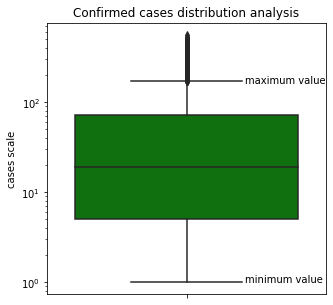

In [ ]:
plt.figure(figsize=(5,5))
sns.boxplot(y='case_count', data=confirmed_cases_cl_2_df, color='green')
plt.yscale('log')
plt.title("Confirmed cases distribution analysis")
plt.annotate("maximum value",(.21,10**2.21))
plt.annotate("minimum value",(.21,10**0))
plt.ylabel("cases scale")
plt.show()

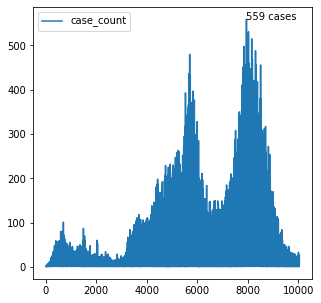

In [ ]:
plt.figure(figsize=(5,5))
confirmed_cases_cl_2_df['case_count'].plot()
x = confirmed_cases_cl_2_df[(confirmed_cases_cl_2_df['case_count']==confirmed_cases_cl_2_df['case_count'].max())].index[0]
plt.annotate("559 cases",(x,confirmed_cases_cl_2_df['case_count'].max()))
plt.legend()

In [ ]:
confirmed_cases_cl_2_df['case_count'].max()

559

**`Conclusion:`**

- The data description indicates that theres substantial deviation from the mean and the box plot shows that there are possible outliers in the dataset
- Using a line plot, it can be observed that there was a lot of fluctuation in activities throughout the period and difference is likely due to that.
- No further transformation required

Duplicated data

In [ ]:
dup_quick_search(confirmed_cases_cl_2_df)

There are no duplicates


**`Conclusion:`**
- There are no duplicates in the data

Setting new index - time series

In [ ]:
# setting date column as index and dropping old index column
# localizing the time to canadian timezone
confirmed_cases_ts_df = confirmed_cases_cl_2_df.set_index('date', drop=True).tz_localize('Canada/Eastern')
confirmed_cases_ts_df.tail(30)

,age_group,gender,case_count
date,,,
2021-07-16 00:00:00-04:00,40s,MALE,11
2021-07-16 00:00:00-04:00,40s,UNSPECIFIED,1
2021-07-16 00:00:00-04:00,50s,FEMALE,3
2021-07-16 00:00:00-04:00,50s,MALE,7
2021-07-16 00:00:00-04:00,50s,UNSPECIFIED,2
2021-07-16 00:00:00-04:00,60s,FEMALE,3
2021-07-16 00:00:00-04:00,60s,MALE,4
2021-07-16 00:00:00-04:00,70s,FEMALE,2
2021-07-16 00:00:00-04:00,70s,MALE,5


In [ ]:
print(f"confirmed cases final data shape: {confirmed_cases_ts_df.shape}")
print(f"confirmed cases final data size: {confirmed_cases_ts_df.size}")

confirmed cases final data shape: (9959, 3)
confirmed cases final data size: 29877


In [ ]:
# getting the pandas profile of dataset
profile_b = ProfileReport(confirmed_cases_city_raw_df, title="Confirmed_cases_by_age_Public_Health_data", html={'style': {'full_width': True}}, sort=None)
profile_b.to_widgets()

**`Conclusion`**
- The percentage of age data retained is: 99.14%
- The Confirmed cases data has been cleaned, converted to timeseries with Canada/Eastern timezone and is ready for processsing.

### C. Vaccine data with age groups

Data types

In [ ]:
# reading vaccination data from csv file
vacc_data_raw_df = pd.read_csv('ontario_vaccination_data_by_age.csv')
vacc_data_raw_df.head(10)

,_id,Date,Agegroup,At least one dose_cumulative,Second_dose_cumulative,Total population,Percent_at_least_one_dose,Percent_fully_vaccinated
0,1,2020-12-16T00:00:00,12-17yrs,0,0,951519,0.0,0.0
1,2,2020-12-16T00:00:00,18-29yrs,45,0,2455535,0.0,0.0
2,3,2020-12-16T00:00:00,30-39yrs,66,0,2056059,0.0,0.0
3,4,2020-12-16T00:00:00,40-49yrs,98,0,1876583,0.0,0.0
4,5,2020-12-16T00:00:00,50-59yrs,141,0,2060934,0.0,0.0
5,6,2020-12-16T00:00:00,60-69yrs,65,0,1795046,0.0,0.0
6,7,2020-12-16T00:00:00,70-79yrs,15,0,1159902,0.0,0.0
7,8,2020-12-16T00:00:00,80+,0,0,679266,0.0,0.0
8,9,2020-12-16T00:00:00,Adults_18plus,430,0,12083325,0.0,0.0
9,10,2020-12-16T00:00:00,Ontario_12plus,430,0,13034844,0.0,0.0


In [ ]:
# verifying columns
vacc_data_raw_df.columns

Index(['_id', 'Date', 'Agegroup', 'At least one dose_cumulative',
       'Second_dose_cumulative', 'Total population',
       'Percent_at_least_one_dose', 'Percent_fully_vaccinated'],
      dtype='object')

In [ ]:
# verifying data types
vacc_data_raw_df.dtypes

_id                               int64
Date                             object
Agegroup                         object
At least one dose_cumulative      int64
Second_dose_cumulative            int64
Total population                  int64
Percent_at_least_one_dose       float64
Percent_fully_vaccinated        float64
dtype: object

In [ ]:
# getting the size and shape of the data
print(f"The size of the raw vaccination with age groups data is {vacc_data_raw_df.size}")
print(f"The shape of the raw vaccination with age groups data is {vacc_data_raw_df.shape}")

The size of the raw vaccination with age groups data is 21120
The shape of the raw vaccination with age groups data is (2640, 8)


**`Observation:`**
- Data contains multiple columns that seem to be indices
- Column names are capitalized and can be made lower case (not mandatory)
- Some columns are of the wrong data type
- Raw data contains some columns that are not needed for this analysis
- Records need to be adjusted to match target eda end date July 17
- The age column contains an 'Undisclosed_or_missing' category and it doesn't seem to be actual age category as there's no recorded population number for those people
- The age column contains 'Adults_18plus' and 'Ontario_12plus' which are just cummulatives of the age ranges in these categories

Data Cleaning

In [ ]:
# reset index
vacc_data_cl_df = vacc_data_raw_df.set_index('_id', drop=True)
vacc_data_cl_df.index.names =[None]
vacc_data_cl_df.head(2)

,Date,Agegroup,At least one dose_cumulative,Second_dose_cumulative,Total population,Percent_at_least_one_dose,Percent_fully_vaccinated
1,2020-12-16T00:00:00,12-17yrs,0,0,951519,0.0,0.0
2,2020-12-16T00:00:00,18-29yrs,45,0,2455535,0.0,0.0


In [ ]:
# rename columns
vacc_data_cl_df.columns = ['date',	'age_group',	'partially_vaccinated', 'fully_vaccinated',
                           'total_population', '%_partially_vaccinated',	'%_fully_vaccinated']
vacc_data_cl_df.head(2)

,date,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
1,2020-12-16T00:00:00,12-17yrs,0,0,951519,0.0,0.0
2,2020-12-16T00:00:00,18-29yrs,45,0,2455535,0.0,0.0


In [ ]:
# correcting the data types
# vacc_data_cl_df.dtypes
vacc_data_cl_df['date'] = pd.to_datetime(vacc_data_cl_df['date'])
vacc_data_cl_df['age_group'] = vacc_data_cl_df['age_group'].astype('category')
vacc_data_cl_df.dtypes

date                      datetime64[ns]
age_group                       category
partially_vaccinated               int64
fully_vaccinated                   int64
total_population                   int64
%_partially_vaccinated           float64
%_fully_vaccinated               float64
dtype: object

In [ ]:
# quick search for duplicates before further cleaning for analysis
vacc_data_cl_df.duplicated().any()

False

In [ ]:
# quick search for null data before further cleaning for analysis
vacc_data_cl_df.isna().any()

date                      False
age_group                 False
partially_vaccinated      False
fully_vaccinated          False
total_population          False
%_partially_vaccinated     True
%_fully_vaccinated         True
dtype: bool

In [ ]:
vacc_data_cl_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2640 entries, 1 to 2640
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    2640 non-null   datetime64[ns]
 1   age_group               2640 non-null   category      
 2   partially_vaccinated    2640 non-null   int64         
 3   fully_vaccinated        2640 non-null   int64         
 4   total_population        2640 non-null   int64         
 5   %_partially_vaccinated  2400 non-null   float64       
 6   %_fully_vaccinated      2400 non-null   float64       
dtypes: category(1), datetime64[ns](1), float64(2), int64(3)
memory usage: 147.4 KB


In [ ]:
vacc_data_cl_df[vacc_data_cl_df['%_partially_vaccinated'].isna()==True]

,date,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
11,2020-12-16,Undisclosed_or_missing,0,0,0,NaN,NaN
22,2020-12-17,Undisclosed_or_missing,0,0,0,NaN,NaN
33,2020-12-18,Undisclosed_or_missing,0,0,0,NaN,NaN
44,2020-12-19,Undisclosed_or_missing,0,0,0,NaN,NaN
55,2020-12-20,Undisclosed_or_missing,0,0,0,NaN,NaN
...,...,...,...,...,...,...,...
2596,2021-08-08,Undisclosed_or_missing,4004,3016,0,NaN,NaN
2607,2021-08-09,Undisclosed_or_missing,4003,3017,0,NaN,NaN
2618,2021-08-10,Undisclosed_or_missing,3996,3021,0,NaN,NaN
2629,2021-08-11,Undisclosed_or_missing,3991,3024,0,NaN,NaN


**`Observations`**
- There are 240 rows with missing data as the age groups of these vaccinated indiviuals were not provided and under the group 'undisclosed_or_missing'.
- hence, there is not population percentage for them. 


In [ ]:
# drop na rows in the data
vacc_data_cl_2_df = vacc_data_cl_df.copy()
vacc_data_cl_2_df.dropna(inplace=True)



In [ ]:
vacc_data_cl_2_df.isna().any()

date                      False
age_group                 False
partially_vaccinated      False
fully_vaccinated          False
total_population          False
%_partially_vaccinated    False
%_fully_vaccinated        False
dtype: bool

In [ ]:
# removing the rows with 'Adults_18plus' and 'Ontario_12plus' as they are merely cummulatives of the age ranges 
vacc_data_cl_3_df = vacc_data_cl_2_df[~vacc_data_cl_2_df['age_group'].isin(["Adults_18plus","Ontario_12plus"])]
vacc_data_cl_3_df.head(10)


,date,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
1,2020-12-16,12-17yrs,0,0,951519,0.0,0.0
2,2020-12-16,18-29yrs,45,0,2455535,0.0,0.0
3,2020-12-16,30-39yrs,66,0,2056059,0.0,0.0
4,2020-12-16,40-49yrs,98,0,1876583,0.0,0.0
5,2020-12-16,50-59yrs,141,0,2060934,0.0,0.0
6,2020-12-16,60-69yrs,65,0,1795046,0.0,0.0
7,2020-12-16,70-79yrs,15,0,1159902,0.0,0.0
8,2020-12-16,80+,0,0,679266,0.0,0.0
12,2020-12-17,12-17yrs,0,0,951519,0.0,0.0
13,2020-12-17,18-29yrs,122,0,2455535,0.0,0.0


In [ ]:
# making the dataset end date consistent with July 17, 2021
vacc_data_cl_3_df = vacc_data_cl_3_df[vacc_data_cl_3_df['date']<='2021-07-17'].reset_index(drop=True)
vacc_data_cl_3_df.tail(2)

,date,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
1710,2021-07-17,70-79yrs,1088303,970174,1159902,0.9383,0.8364
1711,2021-07-17,80+,655021,603328,679266,0.9643,0.8882


Missing values

In [ ]:
# checking for missing data in columns
precent_na_in_cols(vacc_data_cl_3_df)

date - 0.0%
age_group - 0.0%
partially_vaccinated - 0.0%
fully_vaccinated - 0.0%
total_population - 0.0%
%_partially_vaccinated - 0.0%
%_fully_vaccinated - 0.0%


**`conclusion`**
- There are no columns with missing data, hence all have 0.0% missing data result.

- No further transformation required

Checking for outliers

In [ ]:
# decribe the data to see the spread
vacc_data_cl_3_df.describe()

,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
count,1.712000e+03,1.712000e+03,1.712000e+03,1712.000000,1712.000000
mean,4.695228e+05,1.280318e+05,1.629356e+06,0.311037,0.089047
std,5.511343e+05,2.518500e+05,5.834802e+05,0.351952,0.175876
min,0.000000e+00,0.000000e+00,6.792660e+05,0.000000,0.000000
25%,2.851250e+04,2.041000e+03,1.107806e+06,0.017000,0.001000
50%,1.554245e+05,3.751500e+04,1.835814e+06,0.093000,0.020000
75%,9.037892e+05,8.580425e+04,2.057278e+06,0.670325,0.062250
max,1.693587e+06,1.361905e+06,2.455535e+06,0.964300,0.888200


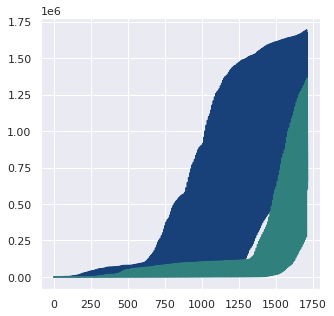

In [ ]:
# plotting partial and full vaccinations
plt.figure(figsize=(5,5))
vacc_data_cl_3_df['partially_vaccinated'].plot()
vacc_data_cl_3_df['fully_vaccinated'].plot()
plt.show()

**`Conclusion`**
- Trend shows consistent progression and so values considered outliers are likely not.
- No transformation done

Duplicated data

In [ ]:
dup_quick_search(vacc_data_cl_3_df)

There are no duplicates


**`Conclusion`** 
- No duplicates found and no further transformation has been carried out

Setting new index - time series

In [ ]:
# setting time series index
vacc_data_ts_df = vacc_data_cl_3_df.set_index('date', drop=True).tz_localize('Canada/Eastern')


In [ ]:
vacc_data_ts_df.head(10)

,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
date,,,,,,
2020-12-16 00:00:00-05:00,12-17yrs,0,0,951519,0.0,0.0
2020-12-16 00:00:00-05:00,18-29yrs,45,0,2455535,0.0,0.0
2020-12-16 00:00:00-05:00,30-39yrs,66,0,2056059,0.0,0.0
2020-12-16 00:00:00-05:00,40-49yrs,98,0,1876583,0.0,0.0
2020-12-16 00:00:00-05:00,50-59yrs,141,0,2060934,0.0,0.0
2020-12-16 00:00:00-05:00,60-69yrs,65,0,1795046,0.0,0.0
2020-12-16 00:00:00-05:00,70-79yrs,15,0,1159902,0.0,0.0
2020-12-16 00:00:00-05:00,80+,0,0,679266,0.0,0.0
2020-12-17 00:00:00-05:00,12-17yrs,0,0,951519,0.0,0.0


In [ ]:
# getting the pandas profile of dataset
profile_c = ProfileReport(vacc_data_ts_df, title="Vaccination_by_age_Public_Health_data", html={'style': {'full_width': True}}, sort=None)
profile_c.to_widgets()

**`Conclusion`**
- The vaccination with age data has been cleaned, converted to timeseries with Canada/Eastern timezone and is ready for processsing.

### D. Google Covid-19 community mobility report for Ontario

Data types

In [ ]:
# reading mobility data for 2020
mobility_2020_raw_df =pd.read_csv('2020_ca_region_mobility_report.csv')
mobility_2020_raw_df.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,CA,Canada,NaN,NaN,NaN,NaN,NaN,ChIJ2WrMN9MDDUsRpY9Doiq3aJk,2020-02-15,4.0,2.0,10.0,3.0,1.0,0.0
1,CA,Canada,NaN,NaN,NaN,NaN,NaN,ChIJ2WrMN9MDDUsRpY9Doiq3aJk,2020-02-16,13.0,8.0,41.0,4.0,0.0,-2.0
2,CA,Canada,NaN,NaN,NaN,NaN,NaN,ChIJ2WrMN9MDDUsRpY9Doiq3aJk,2020-02-17,-12.0,-15.0,63.0,-28.0,-52.0,11.0
3,CA,Canada,NaN,NaN,NaN,NaN,NaN,ChIJ2WrMN9MDDUsRpY9Doiq3aJk,2020-02-18,-1.0,4.0,6.0,-1.0,-1.0,1.0
4,CA,Canada,NaN,NaN,NaN,NaN,NaN,ChIJ2WrMN9MDDUsRpY9Doiq3aJk,2020-02-19,1.0,1.0,9.0,0.0,0.0,0.0


In [ ]:
# verifying columns
mobility_2020_raw_df.columns

Index(['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2',
       'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline'],
      dtype='object')

In [ ]:
# verifying data types
mobility_2020_raw_df.dtypes

country_region_code                                    object
country_region                                         object
sub_region_1                                           object
sub_region_2                                           object
metro_area                                            float64
iso_3166_2_code                                        object
census_fips_code                                      float64
place_id                                               object
date                                                   object
retail_and_recreation_percent_change_from_baseline    float64
grocery_and_pharmacy_percent_change_from_baseline     float64
parks_percent_change_from_baseline                    float64
transit_stations_percent_change_from_baseline         float64
workplaces_percent_change_from_baseline               float64
residential_percent_change_from_baseline              float64
dtype: object

In [ ]:
# getting the size and shape of the data
print(f"The size of the raw 2020 mobility data is {mobility_2020_raw_df.size}")
print(f"The shape of the raw 2020 mobility data is {mobility_2020_raw_df.shape}")

The size of the raw 2020 mobility data is 1159950
The shape of the raw 2020 mobility data is (77330, 15)


In [ ]:
# reading mobility data 2021
mobility_2021_raw_df =pd.read_csv('2021_ca_region_mobility_report.csv')
mobility_2021_raw_df.tail()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
57204,CA,Canada,Yukon,NaN,NaN,CA-YT,NaN,ChIJiYtStJiBF1ER6pbMYdWcFC4,2021-08-04,-7.0,NaN,NaN,NaN,-9.0,NaN
57205,CA,Canada,Yukon,NaN,NaN,CA-YT,NaN,ChIJiYtStJiBF1ER6pbMYdWcFC4,2021-08-05,-1.0,NaN,NaN,NaN,-9.0,NaN
57206,CA,Canada,Yukon,NaN,NaN,CA-YT,NaN,ChIJiYtStJiBF1ER6pbMYdWcFC4,2021-08-06,-9.0,NaN,NaN,NaN,-12.0,NaN
57207,CA,Canada,Yukon,NaN,NaN,CA-YT,NaN,ChIJiYtStJiBF1ER6pbMYdWcFC4,2021-08-07,-18.0,NaN,NaN,NaN,NaN,NaN
57208,CA,Canada,Yukon,NaN,NaN,CA-YT,NaN,ChIJiYtStJiBF1ER6pbMYdWcFC4,2021-08-08,-11.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
# verifying columns
mobility_2021_raw_df.columns

Index(['country_region_code', 'country_region', 'sub_region_1', 'sub_region_2',
       'metro_area', 'iso_3166_2_code', 'census_fips_code', 'place_id', 'date',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline'],
      dtype='object')

In [ ]:
# verifying data types
mobility_2021_raw_df.dtypes

country_region_code                                    object
country_region                                         object
sub_region_1                                           object
sub_region_2                                           object
metro_area                                            float64
iso_3166_2_code                                        object
census_fips_code                                      float64
place_id                                               object
date                                                   object
retail_and_recreation_percent_change_from_baseline    float64
grocery_and_pharmacy_percent_change_from_baseline     float64
parks_percent_change_from_baseline                    float64
transit_stations_percent_change_from_baseline         float64
workplaces_percent_change_from_baseline               float64
residential_percent_change_from_baseline              float64
dtype: object

In [ ]:
# getting the size and shape of the data
print(f"The size of the raw 2021 mobility data is {mobility_2021_raw_df.size}")
print(f"The shape of the raw 2021 mobility data is {mobility_2021_raw_df.shape}")

The size of the raw 2021 mobility data is 858135
The shape of the raw 2021 mobility data is (57209, 15)


`Observation:`
- mobility data started being captured in February while covid was first detected in January in the province
- Data contains multiple regions but only would be used in this analysis
- Some columns are of the wrong data type
- Raw data contains some columns that are not needed for this analysis
- Records need to be adjusted to match target eda end date July 17


Data cleaning

`cleaning 2020`

In [ ]:
# copy raw data for cleaning
mobility_2020_cl_df = mobility_2020_raw_df.copy()

In [ ]:
# create subset of data for ontario
mobility_2020_cl_df = mobility_2020_cl_df[mobility_2020_raw_df['sub_region_1']=='Ontario']
mobility_2020_cl_df.head(3)

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
29748,CA,Canada,Ontario,NaN,NaN,CA-ON,NaN,ChIJrxNRX7IFzkwRCR5iKVZC-HA,2020-02-15,2.0,3.0,20.0,5.0,1.0,-1.0
29749,CA,Canada,Ontario,NaN,NaN,CA-ON,NaN,ChIJrxNRX7IFzkwRCR5iKVZC-HA,2020-02-16,16.0,13.0,44.0,5.0,-2.0,-2.0
29750,CA,Canada,Ontario,NaN,NaN,CA-ON,NaN,ChIJrxNRX7IFzkwRCR5iKVZC-HA,2020-02-17,-26.0,-37.0,70.0,-40.0,-72.0,16.0


In [ ]:
mobility_2020_cl_1_df = mobility_2020_cl_df.copy() 

In [ ]:
# create subset of data with columns needed
mobility_2020_cl_1_df = mobility_2020_cl_df[['date','sub_region_1','retail_and_recreation_percent_change_from_baseline',	'grocery_and_pharmacy_percent_change_from_baseline',	'parks_percent_change_from_baseline','transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline',	'residential_percent_change_from_baseline']]
mobility_2020_cl_1_df.head(2)

,date,sub_region_1,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
29748,2020-02-15,Ontario,2.0,3.0,20.0,5.0,1.0,-1.0
29749,2020-02-16,Ontario,16.0,13.0,44.0,5.0,-2.0,-2.0


In [ ]:
# review data types
mobility_2020_cl_1_df.dtypes

date                                                   object
sub_region_1                                           object
retail_and_recreation_percent_change_from_baseline    float64
grocery_and_pharmacy_percent_change_from_baseline     float64
parks_percent_change_from_baseline                    float64
transit_stations_percent_change_from_baseline         float64
workplaces_percent_change_from_baseline               float64
residential_percent_change_from_baseline              float64
dtype: object

In [ ]:
# correcting date to datetime types
mobility_2020_cl_1_df['date'] = mobility_2020_cl_1_df['date'].astype('datetime64')


In [ ]:
mobility_2020_cl_1_df.dtypes

date                                                  datetime64[ns]
sub_region_1                                                  object
retail_and_recreation_percent_change_from_baseline           float64
grocery_and_pharmacy_percent_change_from_baseline            float64
parks_percent_change_from_baseline                           float64
transit_stations_percent_change_from_baseline                float64
workplaces_percent_change_from_baseline                      float64
residential_percent_change_from_baseline                     float64
dtype: object

In [ ]:
mobility_2020_cl_1_df.shape

(15844, 8)

`cleaning 2021`

In [ ]:
# create subset of data for ontario without sub_region_1 distinctions 
mobility_2021_cl_df = mobility_2021_raw_df[mobility_2021_raw_df['sub_region_1']=='Ontario']
mobility_2021_cl_df.tail(3)

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
33406,CA,Canada,Ontario,Wellington County,NaN,NaN,NaN,ChIJuTjl8B_BK4gRI_6Rd2EM7lk,2021-08-06,-15.0,-3.0,171.0,-25.0,-39.0,7.0
33407,CA,Canada,Ontario,Wellington County,NaN,NaN,NaN,ChIJuTjl8B_BK4gRI_6Rd2EM7lk,2021-08-07,-11.0,4.0,232.0,17.0,-14.0,0.0
33408,CA,Canada,Ontario,Wellington County,NaN,NaN,NaN,ChIJuTjl8B_BK4gRI_6Rd2EM7lk,2021-08-08,-5.0,-1.0,287.0,13.0,-13.0,-2.0


In [ ]:
# create subset of data with columns needed for analysis
mobility_2021_cl_1_df = mobility_2021_cl_df[['date','sub_region_1','retail_and_recreation_percent_change_from_baseline',	'grocery_and_pharmacy_percent_change_from_baseline',	'parks_percent_change_from_baseline','transit_stations_percent_change_from_baseline', 'workplaces_percent_change_from_baseline',	'residential_percent_change_from_baseline']]
mobility_2021_cl_1_df.head(2)

,date,sub_region_1,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
22220,2021-01-01,Ontario,-79.0,-74.0,-1.0,-83.0,-85.0,33.0
22221,2021-01-02,Ontario,-51.0,-20.0,17.0,-60.0,-30.0,14.0


In [ ]:
mobility_2021_cl_1_df.shape

(11189, 8)

In [ ]:
# review data types
mobility_2021_cl_1_df.dtypes

date                                                   object
sub_region_1                                           object
retail_and_recreation_percent_change_from_baseline    float64
grocery_and_pharmacy_percent_change_from_baseline     float64
parks_percent_change_from_baseline                    float64
transit_stations_percent_change_from_baseline         float64
workplaces_percent_change_from_baseline               float64
residential_percent_change_from_baseline              float64
dtype: object

In [ ]:
# correcting date to datetime types
mobility_2021_cl_1_df['date'] = pd.to_datetime(mobility_2021_cl_1_df['date'])

In [ ]:

mobility_2021_cl_1_df.head(2)

,date,sub_region_1,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
22220,2021-01-01,Ontario,-79.0,-74.0,-1.0,-83.0,-85.0,33.0
22221,2021-01-02,Ontario,-51.0,-20.0,17.0,-60.0,-30.0,14.0


In [ ]:
mobility_2021_cl_1_df.dtypes

date                                                  datetime64[ns]
sub_region_1                                                  object
retail_and_recreation_percent_change_from_baseline           float64
grocery_and_pharmacy_percent_change_from_baseline            float64
parks_percent_change_from_baseline                           float64
transit_stations_percent_change_from_baseline                float64
workplaces_percent_change_from_baseline                      float64
residential_percent_change_from_baseline                     float64
dtype: object

Missing values

In [ ]:
# for mobility 2020
precent_na_in_cols(mobility_2020_cl_1_df)


date - 0.0%
sub_region_1 - 0.0%
retail_and_recreation_percent_change_from_baseline - 12.5%
grocery_and_pharmacy_percent_change_from_baseline - 13.4%
parks_percent_change_from_baseline - 60.5%
transit_stations_percent_change_from_baseline - 41.8%
workplaces_percent_change_from_baseline - 2.0%
residential_percent_change_from_baseline - 18.8%


- There are multiple columns with missing data.

- Let's dig deeper into the location and other content of these records with missing information

In [ ]:
# finding the rcords with missing data
mobility_2020_cl_1_df[(mobility_2020_cl_1_df['retail_and_recreation_percent_change_from_baseline'].isna()==True)|
                      (mobility_2020_cl_1_df['grocery_and_pharmacy_percent_change_from_baseline'].isna()==True) |
                      (mobility_2020_cl_1_df['parks_percent_change_from_baseline'].isna()==True) |
                      (mobility_2020_cl_1_df['transit_stations_percent_change_from_baseline'].isna()==True) |
                      (mobility_2020_cl_1_df['workplaces_percent_change_from_baseline'].isna()==True) |
                      (mobility_2020_cl_1_df['residential_percent_change_from_baseline'].isna()==True)
                      ]

                      

,date,sub_region_1,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
30070,2020-02-16,Ontario,5.0,-1.0,NaN,-3.0,-5.0,0.0
30071,2020-02-17,Ontario,-51.0,-66.0,NaN,-28.0,-66.0,12.0
30076,2020-02-22,Ontario,5.0,5.0,NaN,14.0,4.0,-2.0
30077,2020-02-23,Ontario,10.0,-7.0,NaN,-1.0,3.0,-1.0
30078,2020-02-24,Ontario,7.0,-1.0,NaN,-6.0,2.0,0.0
...,...,...,...,...,...,...,...,...
45475,2020-09-06,Ontario,-1.0,0.0,NaN,NaN,-15.0,-3.0
45476,2020-09-07,Ontario,-51.0,-53.0,NaN,-30.0,-81.0,20.0
45477,2020-09-08,Ontario,-9.0,8.0,NaN,-29.0,-36.0,10.0
45478,2020-09-09,Ontario,-10.0,3.0,NaN,-33.0,-35.0,9.0


In [ ]:
# checking for possible duplicate dates
mobility_2020_cl_1_df['date'].duplicated().any()

True

In [ ]:
# looking further to see if the first date from our NA df is duplicated
mobility_2020_cl_1_df[mobility_2020_cl_1_df['date']=='2020-02-16'].head(5)

,date,sub_region_1,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
29749,2020-02-16,Ontario,16.0,13.0,44.0,5.0,-2.0,-2.0
30070,2020-02-16,Ontario,5.0,-1.0,NaN,-3.0,-5.0,0.0
30391,2020-02-16,Ontario,20.0,NaN,NaN,NaN,NaN,NaN
30706,2020-02-16,Ontario,10.0,11.0,NaN,NaN,-3.0,-3.0
31027,2020-02-16,Ontario,23.0,23.0,NaN,NaN,1.0,NaN


In [ ]:
# since there are serveral duplicated dates, fill na with 0 
# then, use average for dates for further processing
mobility_2020_cl_1_df.fillna(0, inplace=True)

In [ ]:
# re-check missing values
precent_na_in_cols(mobility_2020_cl_1_df)

date - 0.0%
sub_region_1 - 0.0%
retail_and_recreation_percent_change_from_baseline - 0.0%
grocery_and_pharmacy_percent_change_from_baseline - 0.0%
parks_percent_change_from_baseline - 0.0%
transit_stations_percent_change_from_baseline - 0.0%
workplaces_percent_change_from_baseline - 0.0%
residential_percent_change_from_baseline - 0.0%


The 2020 mobility data no longer has missing values

In [ ]:
# fixing duplicates - mobility 2021
dup_quick_search(mobility_2020_cl_1_df)

There are some duplicates


In [ ]:
# getting the length of rows that have been duplicated
len(mobility_2020_cl_1_df[mobility_2020_cl_1_df.duplicated()==True])

218

In [ ]:
# to eradicate duplicates - 
# since unsure of data, group by date and take averages for duplicated dates
mobility_2020_grp_df = mobility_2020_cl_1_df.groupby('date')[mobility_2020_cl_1_df.columns].mean().reset_index()
mobility_2020_grp_df.head(2)

,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,2020-02-15,6.234043,4.340426,12.851064,14.744681,1.638298,-0.617021
1,2020-02-16,15.234043,14.085106,19.680851,4.085106,-1.468085,-1.212766


In [ ]:
# re-checking for duplicates
mobility_2020_grp_df.duplicated().any()

False

`checking for missing values in 2021`

In [ ]:
# for mobility 2021
precent_na_in_cols(mobility_2021_cl_1_df)

date - 0.0%
sub_region_1 - 0.0%
retail_and_recreation_percent_change_from_baseline - 11.2%
grocery_and_pharmacy_percent_change_from_baseline - 11.4%
parks_percent_change_from_baseline - 60.5%
transit_stations_percent_change_from_baseline - 41.0%
workplaces_percent_change_from_baseline - 0.0%
residential_percent_change_from_baseline - 13.7%


In [ ]:
# checking for possible duplicate dates
mobility_2021_cl_1_df['date'].duplicated().any()

True

In [ ]:
# fill na with 0 
# then, use average for dates for further processing
mobility_2021_cl_1_df.fillna(0, inplace=True)

In [ ]:
# re-check missing values
precent_na_in_cols(mobility_2021_cl_1_df)

date - 0.0%
sub_region_1 - 0.0%
retail_and_recreation_percent_change_from_baseline - 0.0%
grocery_and_pharmacy_percent_change_from_baseline - 0.0%
parks_percent_change_from_baseline - 0.0%
transit_stations_percent_change_from_baseline - 0.0%
workplaces_percent_change_from_baseline - 0.0%
residential_percent_change_from_baseline - 0.0%


The 2021 mobility data no longer has missing values

In [ ]:
# fixing duplicates - mobility 2021
dup_quick_search(mobility_2021_cl_1_df)


There are some duplicates


In [ ]:
# getting the rows that have been duplicated
len(mobility_2021_cl_1_df[mobility_2021_cl_1_df.duplicated()==True])

79

In [ ]:
# to eradicate duplicates - 
# since unsure of data, group by date and take averages for duplicated dates
mobility_2021_grp_df = mobility_2021_cl_1_df.groupby('date')[mobility_2021_cl_1_df.columns].mean().reset_index()
mobility_2021_grp_df.head(2)

,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,2021-01-01,-70.615385,-65.307692,1.596154,-43.634615,-81.961538,27.365385
1,2021-01-02,-40.660000,-12.820000,12.560000,-31.260000,-26.180000,9.100000


In [ ]:
# re-checking duplicates - 
mobility_2021_grp_df.duplicated().any()

False

Checking for outliers

`2020`

In [ ]:
# checking for outliers 
mobility_2020_grp_df.describe()

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
count,321.000000,321.000000,321.000000,321.000000,321.000000,321.000000
mean,-12.464695,1.002950,15.322276,-18.468664,-25.626151,7.588006
std,17.160772,13.182951,20.388848,10.458751,18.923134,5.184913
min,-75.634615,-70.288462,-21.901961,-42.846154,-82.961538,-1.666667
25%,-18.980000,-2.760000,0.000000,-24.461538,-35.961538,4.020833
50%,-7.461538,2.961538,10.600000,-19.355556,-26.500000,7.434783
75%,-2.230769,7.634615,28.596154,-13.466667,-8.595745,9.961538
max,15.382979,46.057692,80.384615,14.744681,8.520833,23.442308


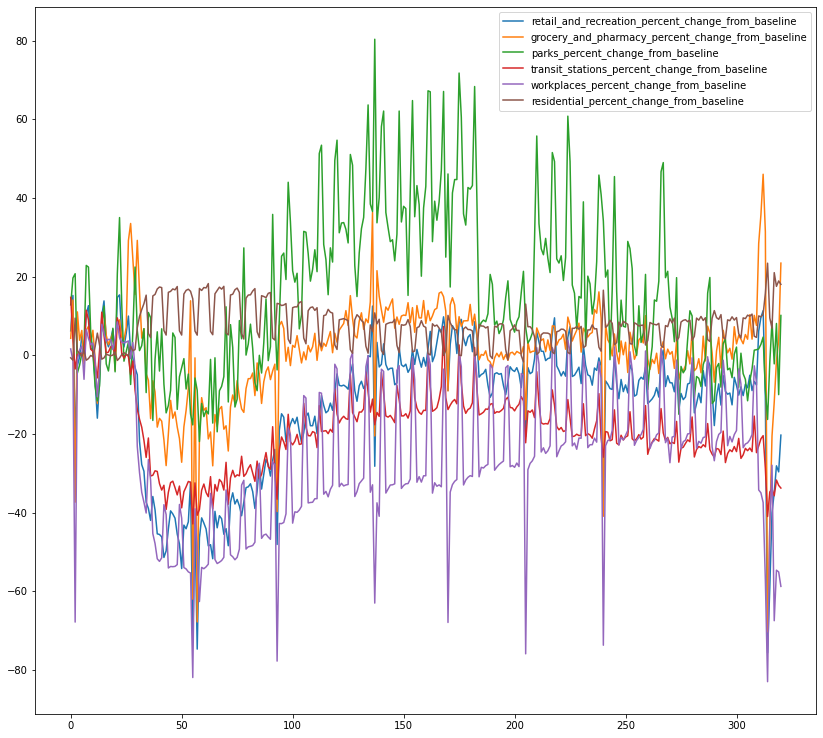

In [ ]:
plt.figure(figsize=(14,13))
mobility_2020_grp_df['retail_and_recreation_percent_change_from_baseline'].plot()
mobility_2020_grp_df['grocery_and_pharmacy_percent_change_from_baseline'].plot()
mobility_2020_grp_df['parks_percent_change_from_baseline'].plot()
mobility_2020_grp_df['transit_stations_percent_change_from_baseline'].plot()
mobility_2020_grp_df['workplaces_percent_change_from_baseline'].plot()
mobility_2020_grp_df['residential_percent_change_from_baseline'].plot()
plt.legend(loc='upper right')
plt.show()

`2021`

In [ ]:
# check for outliers
mobility_2021_grp_df.describe()

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
count,220.000000,220.000000,220.000000,220.000000,220.000000,220.000000
mean,-13.945846,3.849563,19.379391,-23.544463,-26.463807,8.742197
std,19.253995,15.199105,22.519439,8.620087,12.263124,4.684521
min,-70.615385,-65.307692,-18.134615,-43.634615,-81.961538,-2.170213
25%,-28.641827,-5.841346,-0.163462,-29.078689,-32.572115,5.691106
50%,-14.757212,2.086538,18.679331,-24.868863,-27.355769,9.078846
75%,2.048478,16.633413,33.682692,-19.455230,-20.924532,12.110577
max,27.680851,47.038462,80.000000,9.000000,-1.893617,27.365385


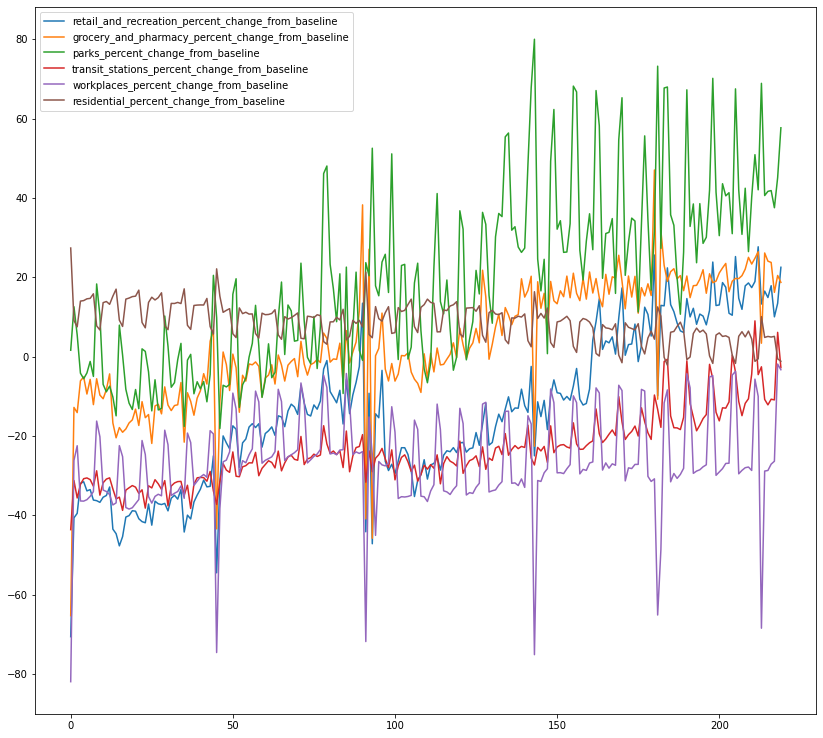

In [ ]:
plt.figure(figsize=(14,13))
mobility_2021_grp_df['retail_and_recreation_percent_change_from_baseline'].plot()
mobility_2021_grp_df['grocery_and_pharmacy_percent_change_from_baseline'].plot()
mobility_2021_grp_df['parks_percent_change_from_baseline'].plot()
mobility_2021_grp_df['transit_stations_percent_change_from_baseline'].plot()
mobility_2021_grp_df['workplaces_percent_change_from_baseline'].plot()
mobility_2021_grp_df['residential_percent_change_from_baseline'].plot()
plt.legend(loc='upper left')
plt.show()

A number of peaks can be obesrved in the data, however, considering the public health restrictions during the pandemic and the human consciuosness, the likelihood of having short periods of peaks with eased restrictions is increased. Data would be retained in current state for analysis.

Duplicated data

In [ ]:
# re-checking duplicates - 2020
dup_quick_search(mobility_2020_grp_df)

There are no duplicates


In [ ]:
len(mobility_2020_grp_df)

321

In [ ]:
mobility_2020_grp_df['date'].unique

<bound method Series.unique of 0     2020-02-15
1     2020-02-16
2     2020-02-17
3     2020-02-18
4     2020-02-19
         ...    
316   2020-12-27
317   2020-12-28
318   2020-12-29
319   2020-12-30
320   2020-12-31
Name: date, Length: 321, dtype: datetime64[ns]>

In [ ]:
# re-checking duplicates - 2021
dup_quick_search(mobility_2021_grp_df)

There are no duplicates


In [ ]:
len(mobility_2020_grp_df)

321

In [ ]:
mobility_2021_grp_df['date'].unique

<bound method Series.unique of 0     2021-01-01
1     2021-01-02
2     2021-01-03
3     2021-01-04
4     2021-01-05
         ...    
215   2021-08-04
216   2021-08-05
217   2021-08-06
218   2021-08-07
219   2021-08-08
Name: date, Length: 220, dtype: datetime64[ns]>

No duplicates found

In [ ]:
# re- define data duration for 2021 (as analysis ends July 17,2021)
mobility_2021_grp_sl_df = mobility_2021_grp_df[mobility_2021_grp_df['date']<='2021-07-17']
mobility_2021_grp_sl_df.tail(3)

,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
195,2021-07-15,10.211538,21.903846,28.538462,-15.634615,-27.788462,6.673077
196,2021-07-16,8.000000,15.961538,30.076923,-14.615385,-27.288462,5.692308
197,2021-07-17,11.645833,20.875000,41.958333,-1.958333,-5.166667,0.166667


Setting new index - time series

In [ ]:
# creating time series version of data - 2020
mobility_2020_ts_df = mobility_2020_grp_df.set_index('date', drop=True).tz_localize('Canada/Eastern')
mobility_2020_ts_df.index.names=[None]
mobility_2020_ts_df.head(1)

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
2020-02-15 00:00:00-05:00,6.234043,4.340426,12.851064,14.744681,1.638298,-0.617021


In [ ]:
print(f"Size of mobility ts data 2020: {mobility_2020_ts_df.size} ")
print(f"Shape of mobility ts data 2020: {mobility_2020_ts_df.shape} ")
print(len(mobility_2020_ts_df))

Size of mobility ts data 2020: 1926 
Shape of mobility ts data 2020: (321, 6) 
321


In [ ]:
# creating time series version of data
mobility_2021_ts_df = mobility_2021_grp_sl_df.set_index('date', drop=True).tz_localize('Canada/Eastern')
mobility_2021_ts_df.index.names =[None]
mobility_2021_ts_df.head(1)

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
2021-01-01 00:00:00-05:00,-70.615385,-65.307692,1.596154,-43.634615,-81.961538,27.365385


In [ ]:
print(f"The size of mobility_ts data 2020: {mobility_2021_ts_df.size} ")
print(f"The shape of mobility_ts data 2021: {mobility_2021_ts_df.shape} ")



The size of mobility_ts data 2020: 1188 
The shape of mobility_ts data 2021: (198, 6) 


In [ ]:
# combined data for both years
mobility_ts_df = mobility_2020_ts_df.append(mobility_2021_ts_df)
mobility_ts_df.index.tz_convert('Canada/Eastern')
mobility_ts_df.head(2)

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
2020-02-15 00:00:00-05:00,6.234043,4.340426,12.851064,14.744681,1.638298,-0.617021
2020-02-16 00:00:00-05:00,15.234043,14.085106,19.680851,4.085106,-1.468085,-1.212766


In [ ]:
print(f"The size of mobility_ts data 2020: {mobility_ts_df.size} ")
print(f"The shape of mobility_ts data 2021: {mobility_ts_df.shape} ")


The size of mobility_ts data 2020: 3114 
The shape of mobility_ts data 2021: (519, 6) 


In [ ]:
# getting the pandas profile of dataset
profile_d = ProfileReport(mobility_ts_df, title="Google Mobility Data for Ontario", html={'style': {'full_width': True}}, sort=None)
profile_d.to_widgets()

**`Conclusion`**
- It is important to note that almost all the columns selected for this analysis had null values, however, on further investigation, it was observed that there was a large number of duplicated rows in the data and most were part of the records with NA values.
- To minimize data loss, the na values were filled with 0, the data was grouped by dates and an average percent mobility value was computed for duplicated records.
- A number of peaks can be obesrved in the data, however, considering the public health restrictions during the pandemic and the human consciuosness, the likelihood of having short periods of peaks with eased restrictions is increased. Data would be retained in current state for analysis.
- The points above apply to data for 2020 and 2021.
- The mobility data for 2020 and 2021 has now been cleaned, combined into a new df, converted to timeseries with Canada/Eastern timezone and is ready for processsing.
 

## Data Exploration and Analysis

**`Existing pandemic strategy`**: Ontario will likely overcome the pandemic quicker by prioritizing the older/compromised population for vaccinations and tightening restrictions on mobility.

<br>

Does this strategy translate into Ontario's reality? Let's begin exploring the data.

### **`Ontario covid-19 Overview`**
Graphing the number of covid-19 related activities in Ontario. This gives us a big picture of the ongoing pandemic.

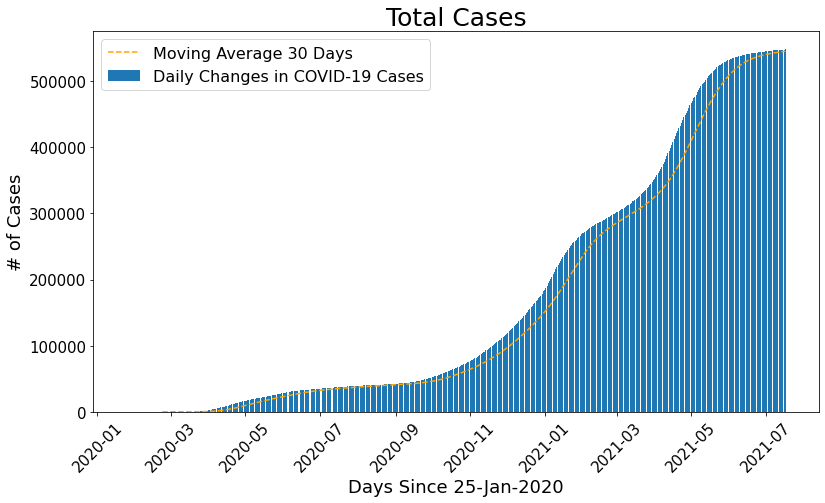

In [ ]:
# daily cases and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_cases'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_cases'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Cases', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of Cases', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 Cases'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()


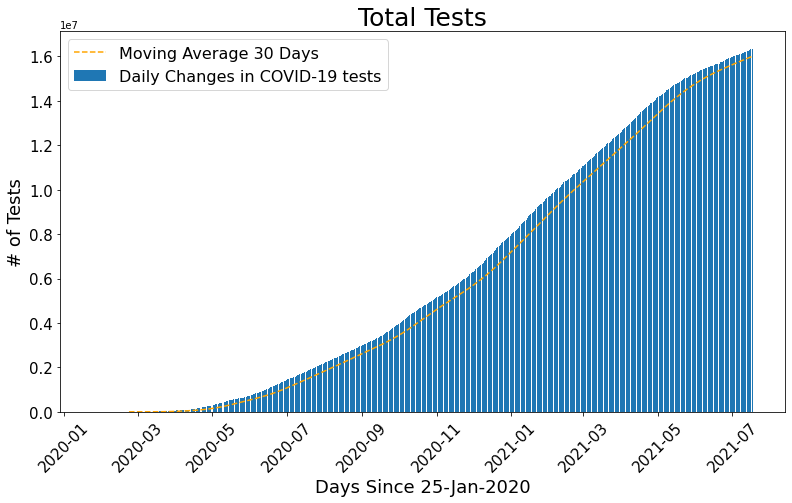

In [ ]:
# daily tests and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_tests'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_tests'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Tests', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of Tests', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 tests'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()

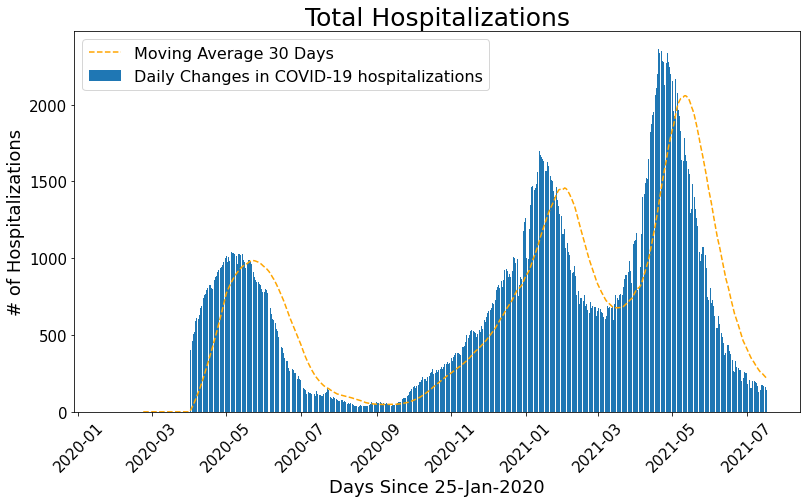

In [ ]:
# daily hospitalizations and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_hospitalizations'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_hospitalizations'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Hospitalizations', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of Hospitalizations', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 hospitalizations'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()

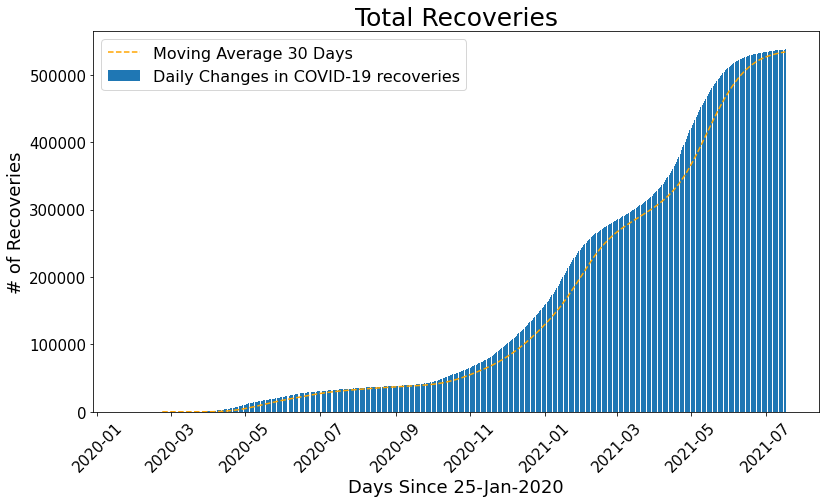

In [ ]:
# daily recoveries and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_recoveries'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_recoveries'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Recoveries', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of Recoveries', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 recoveries'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()

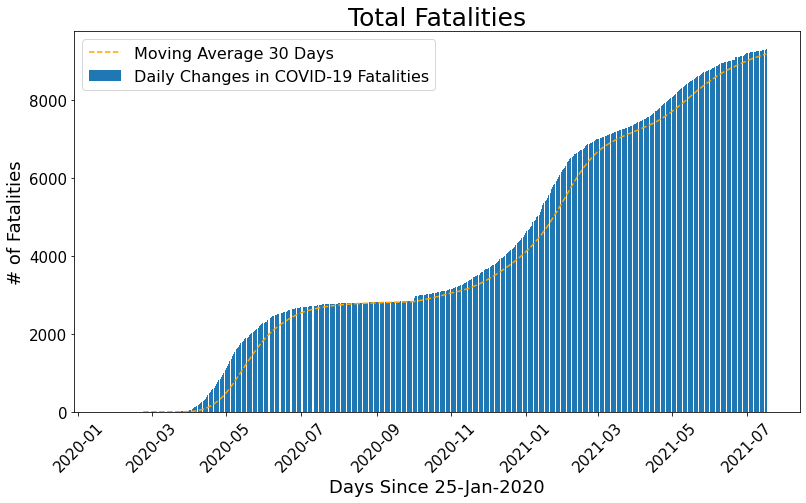

In [ ]:
# daily fatalities and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_fatalities'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_fatalities'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Fatalities', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of Fatalities', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 Fatalities'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()

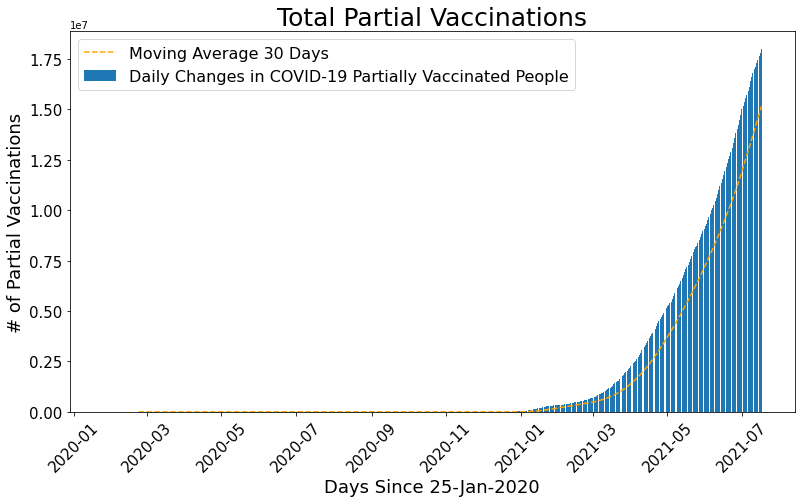

In [ ]:
# daily partial vaccinations and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_vaccinations'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_vaccinations'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Partial Vaccinations', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of Partial Vaccinations', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 Partially Vaccinated People'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()

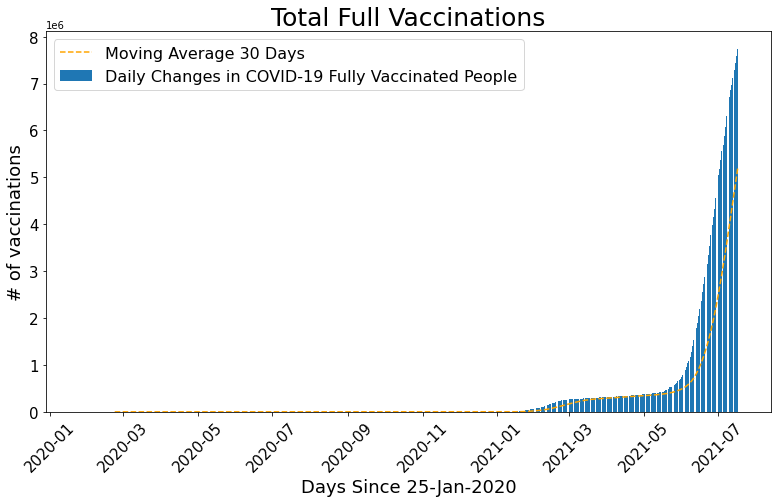

In [ ]:
# daily full vaccinations and 30 day moving average since the commencement of the pandemic to 17-July 2021
window=30
plt.figure(figsize=(13, 7))
plt.bar(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_vaccinated'])
plt.plot(ontariocovid_vaccine_ts_df.index, ontariocovid_vaccine_ts_df['total_vaccinated'].rolling(window).mean(), color='orange', linestyle='dashed')
plt.title('Total Full Vaccinations', size=25)
plt.xlabel('Days Since 25-Jan-2020', size=18)
plt.ylabel('# of vaccinations', size=18)
plt.legend(['Moving Average {} Days'.format(window), 'Daily Changes in COVID-19 Fully Vaccinated People'], prop={'size': 16})
plt.xticks(size=15, rotation=45)
plt.yticks(size=15)
plt.show()

### **`Question 1`**: 
Is there an observable relationship between the reported covid cases, other related activities and the proposed medical solution i.e. vaccination?

In [ ]:
# Assessing degree of correlation between variables
ontariocovid_vaccine_corr_df = ontariocovid_vaccine_ts_df.corr()
ontariocovid_vaccine_corr_df.head(2)

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
change_cases,1.000000,0.473826,0.707659,0.073889,0.268761,0.922888,0.226406,-0.165964,0.048572,0.491306,0.527978,0.573051,0.855737,0.773312,0.448976,0.054404,-0.114839,0.065086
change_fatalities,0.473826,1.000000,0.371175,-0.057767,0.007743,0.520527,0.002527,-0.083925,0.020417,0.165894,0.178887,0.177395,0.660023,0.453648,0.142329,-0.053500,-0.101277,-0.051679


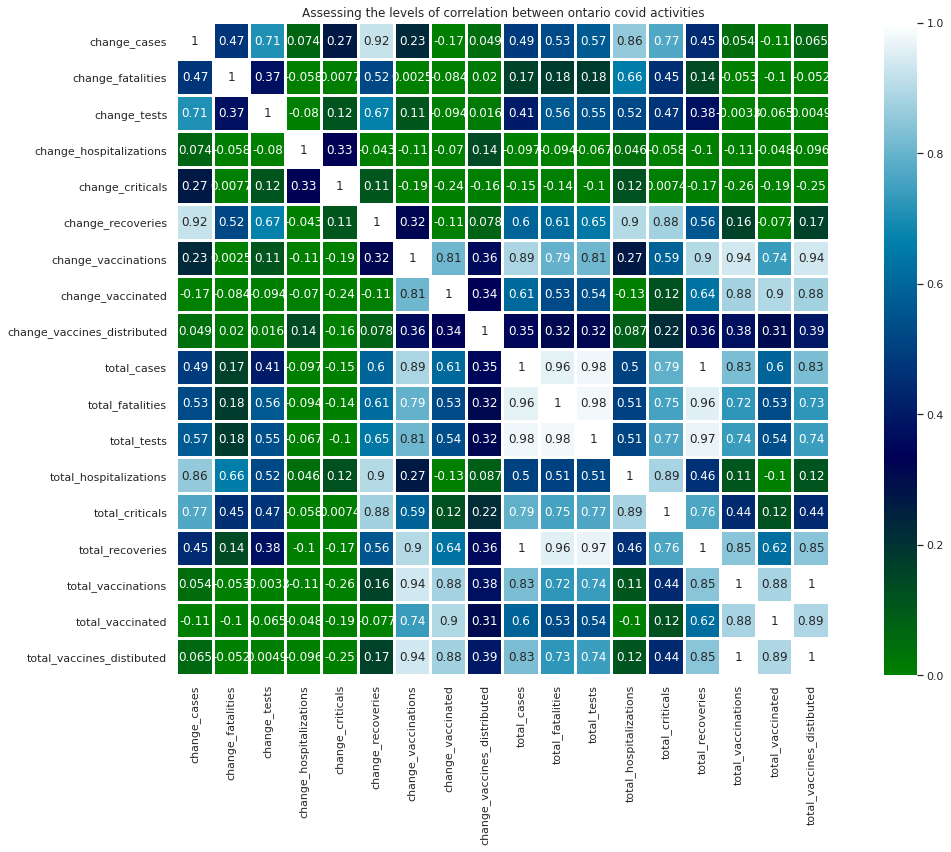

In [ ]:
# Assessing degree of correlation between variables - visually
plt.figure(figsize=(19.8,12))
sns.heatmap(ontariocovid_vaccine_corr_df, cmap='ocean', linewidths=2,vmax=1, vmin=0, square=True, annot=True)
plt.title("Assessing the levels of correlation between ontario covid activities")
plt.show()

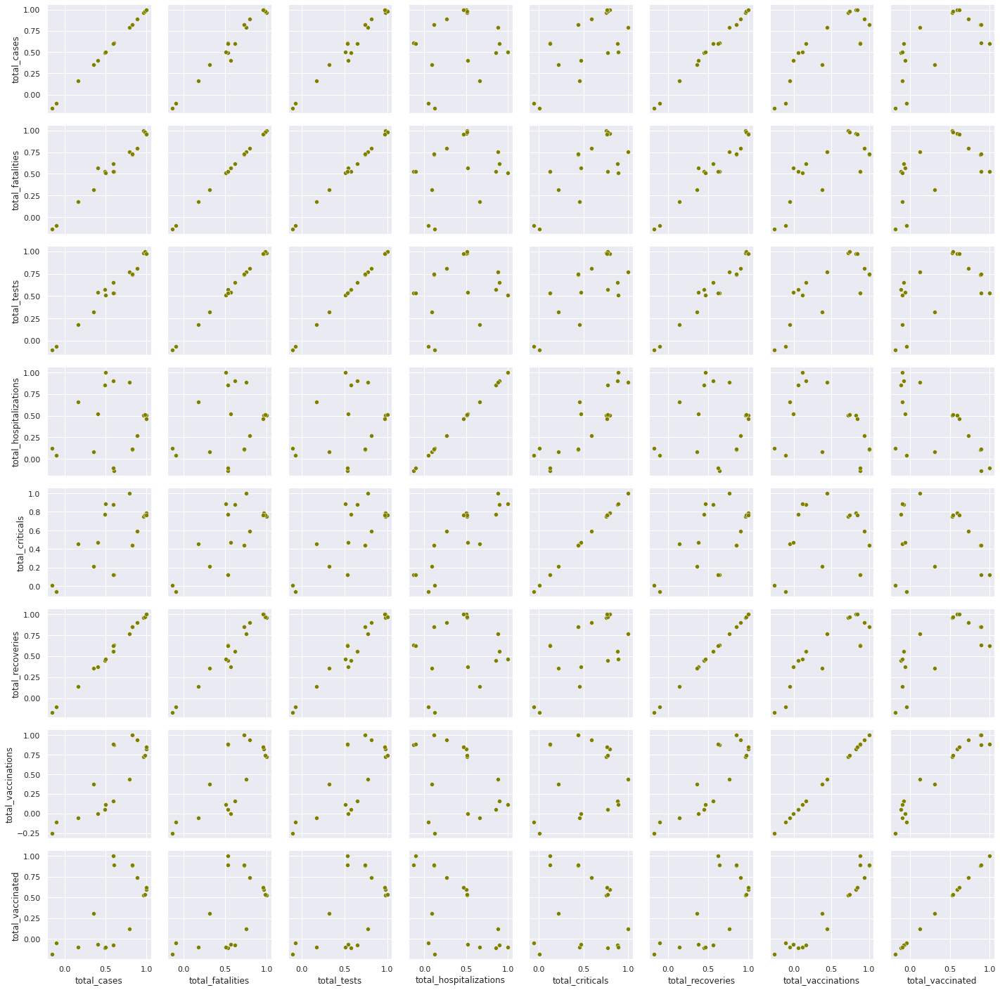

In [ ]:
# making a pair plot of the variables in the dataset 
g = sns.PairGrid(ontariocovid_vaccine_corr_df[['total_cases',	'total_fatalities',	'total_tests',	'total_hospitalizations',	'total_criticals',	'total_recoveries',	'total_vaccinations',	'total_vaccinated']])
g.map(sns.scatterplot, color ='olive')
plt.show()

**`Observation:`**
- Since Change cases shows the number of cases per day, correlation might be skewed as events take on new values daily.

- A streamline review of total cases vs covid activities and preventive solutions is done next

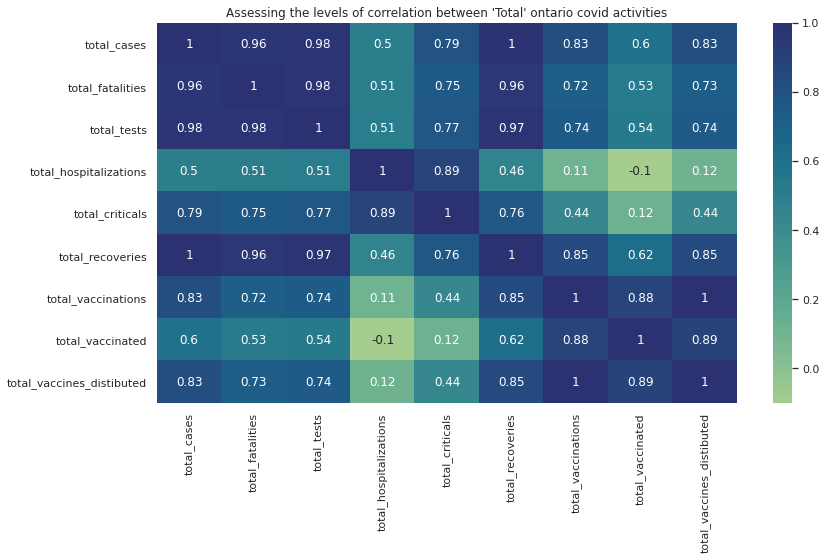

In [ ]:
plt.figure(figsize=(13,7))
sns.heatmap(ontariocovid_vaccine_corr_df.loc['total_cases':,'total_cases':], annot=True, cmap='crest')
plt.title("Assessing the levels of correlation between 'Total' ontario covid activities")
plt.show()

**`Observation`**
- The plot above shows that most of the correlation in the total data are positive. Although the correlation between hospitalizations, criticals and  vaccination activities are low and close to none.

- From the plot above, it can be observed that there is a positive correlation between total cases and the total values of other covid-related activities.



In [ ]:
# Reviewing the correlation of data variables since the commencement of vaccinations
# let's create data frame that'll hold information from when Ontario had over 0 partially vaccinated people
vaccine_activities_df= ontariocovid_vaccine_ts_df[ontariocovid_vaccine_ts_df['change_vaccinations']>0]

vaccine_activities_df.head(3)

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
2020-12-14 00:00:00-05:00,1940,23,57091,44,-7,1535,5,0,6000,142121,3972,7019734,857,264,121563,5,0,6000
2020-12-15 00:00:00-05:00,2275,20,39566,64,5,1810,426,0,0,144396,3992,7059300,921,269,123373,431,0,6000
2020-12-16 00:00:00-05:00,2139,43,49189,11,8,2043,544,0,0,146535,4035,7108489,932,277,125416,975,0,6000


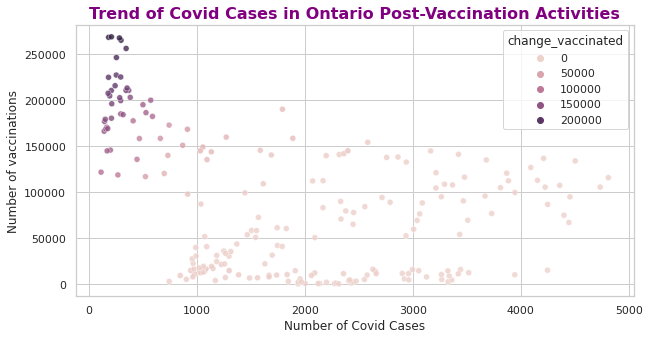

In [ ]:
# visualizing data using scatter plot
plt.figure(figsize=(10,5))
sns.set_style("whitegrid")
sns.scatterplot(data=vaccine_activities_df, x='change_cases',y='change_vaccinations',hue='change_vaccinated',legend ='auto', alpha=0.8)
plt.title('Trend of Covid Cases in Ontario Post-Vaccination Activities', fontdict={'color':'purple','fontsize':16,'fontweight':'bold'})
plt.xlabel('Number of Covid Cases')
plt.ylabel('Number of vaccinations')
plt.show()

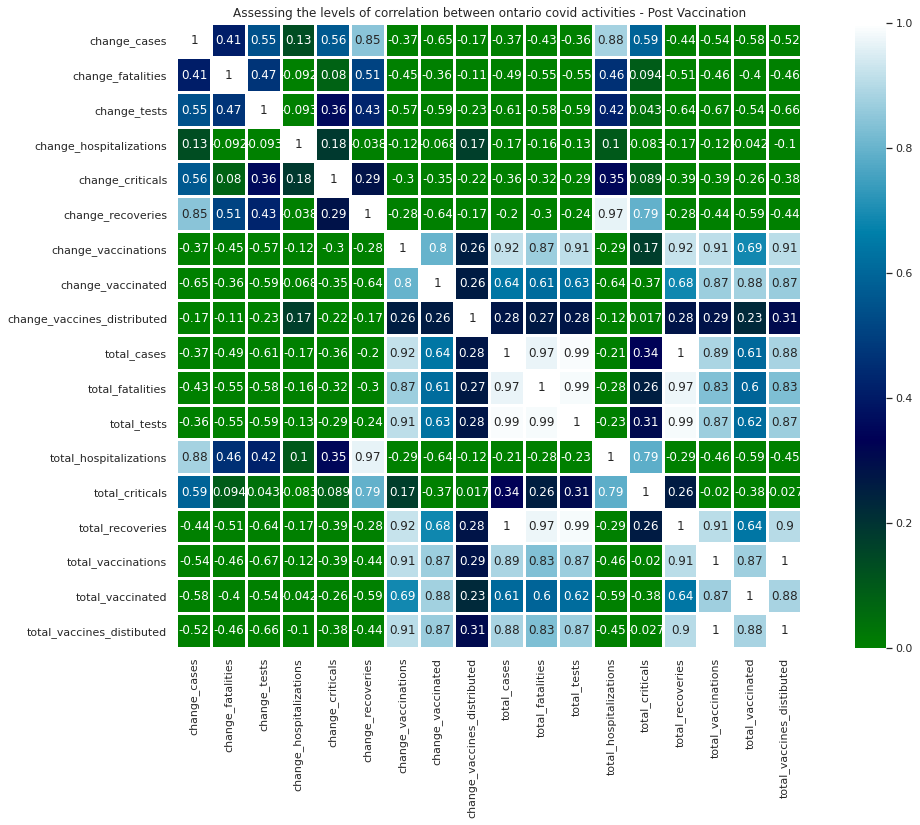

In [ ]:
# Assessing degree of correlation between variables - after vaccination commenced
plt.figure(figsize=(19,11.5))
sns.heatmap(vaccine_activities_df.corr(), cmap='ocean', linewidths=2, vmax=1, vmin=0, square=True, annot=True)
plt.title("Assessing the levels of correlation between ontario covid activities - Post Vaccination")
plt.show()

**`Observation`**
- The charts above shows that there the covid related events and vaccination activities in the province are correlated.

- With a focus on the correlation of total cases to all the other element, in the data pre and post vaccination, it can be observed that there is a positive correlation between total cases and other totals but its correlation with hospitalizations and criticals are the lowest.



### **`Question 2`**: 
Is there an influence on the number of reported cases in ontario by people's activities across the days of the week?

In [ ]:
# creating a sub data frame with cases 
day_vs_cases_df = ontariocovid_vaccine_ts_df.loc[:,'change_cases':'total_cases']
day_vs_cases_df.head()

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases
2020-01-25 00:00:00-05:00,1,0,0,0,0,0,0,0,0,1
2020-01-26 00:00:00-05:00,1,0,0,0,0,0,0,0,0,2
2020-01-27 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2
2020-01-28 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2
2020-01-29 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2


In [ ]:
# adding a column with the days of the week
day_vs_cases_df['day_of_week'] = day_vs_cases_df.index.dayofweek
day_vs_cases_df['day_name'] = day_vs_cases_df.index.day_name()

In [ ]:
day_vs_cases_df.head()
# day_vs_cases_df.isna().any()    # double-checking for any missing value: none found

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,day_of_week,day_name
2020-01-25 00:00:00-05:00,1,0,0,0,0,0,0,0,0,1,5,Saturday
2020-01-26 00:00:00-05:00,1,0,0,0,0,0,0,0,0,2,6,Sunday
2020-01-27 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2,0,Monday
2020-01-28 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2,1,Tuesday
2020-01-29 00:00:00-05:00,0,0,0,0,0,0,0,0,0,2,2,Wednesday


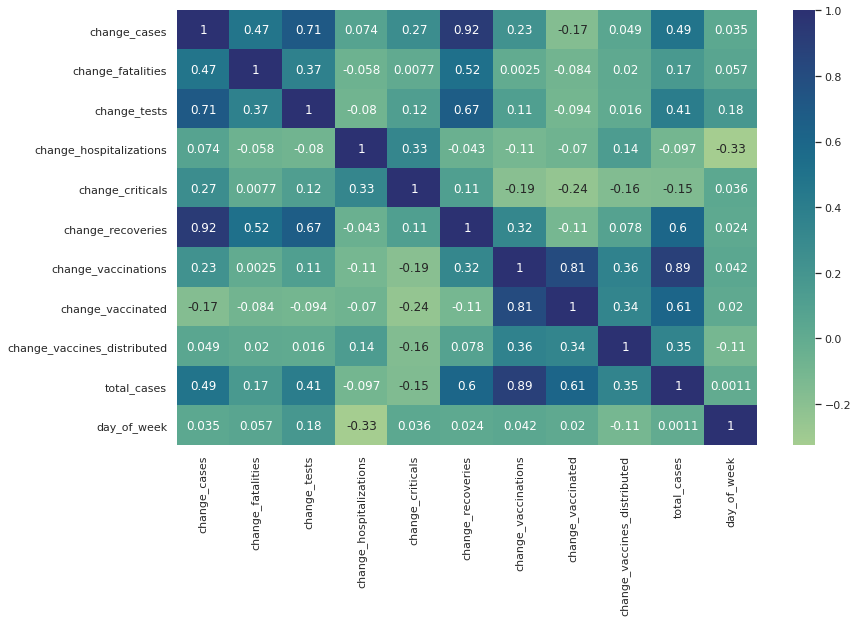

In [ ]:
sns.set(style='darkgrid')
plt.figure(figsize=(13,8))
sns.heatmap(day_vs_cases_df.corr(), annot=True, cmap='crest')

<Figure size 1800x5760 with 0 Axes>

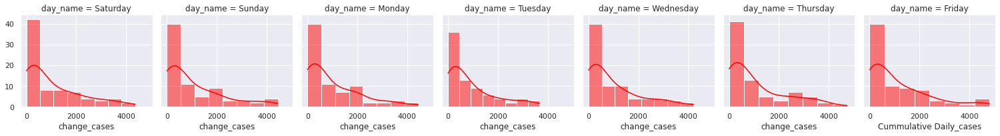

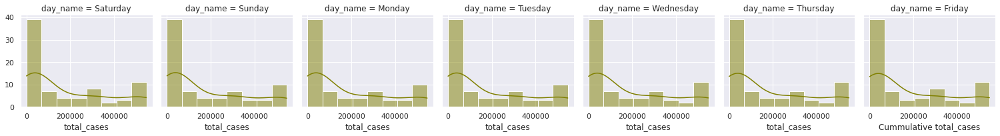

In [ ]:
# exploring the relationship between day of week, cummulative daily and total cases
sns.set(style='darkgrid')
sns.set(palette='gist_earth')
fig = plt.figure(figsize=(25,80))

g =sns.FacetGrid(day_vs_cases_df, col='day_name')
g.map(sns.histplot, 'change_cases',kde=True, color='red')
plt.xlabel("Cummulative Daily_cases")


r = sns.FacetGrid(day_vs_cases_df, col='day_name')
r.map(sns.histplot, 'total_cases', kde=True, color='olive')
plt.xlabel("Cummulative total_cases")

plt.show()

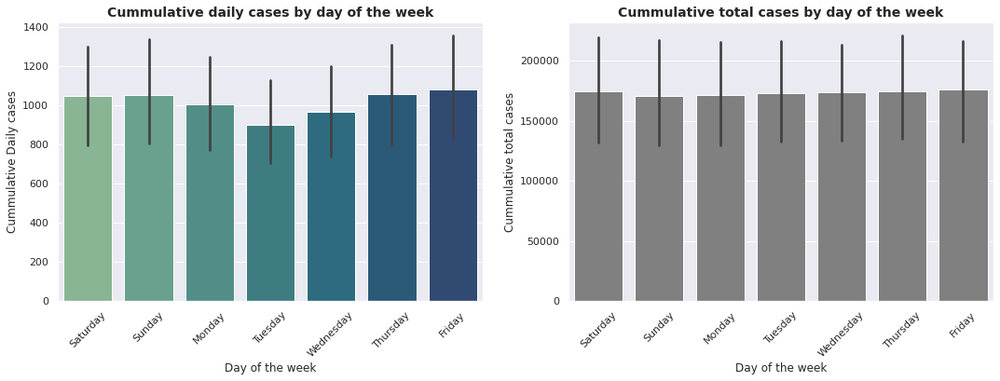

In [ ]:
gridspec.GridSpec(1,2)
fig = plt.figure(figsize=(18,5.5))
sns.set_style("darkgrid")

plt.subplot2grid((1,2),(0,0))
sns.barplot(x=day_vs_cases_df['day_name'], y =day_vs_cases_df['change_cases'], palette='crest')
plt.xticks(rotation = 45)
plt.title("Cummulative daily cases by day of the week", fontdict={'fontsize':14,'fontweight':'bold'})
plt.ylabel("Cummulative Daily cases")
plt.xlabel("Day of the week")

plt.subplot2grid((1,2),(0,1))
sns.barplot(x=day_vs_cases_df['day_name'],y=day_vs_cases_df['total_cases'], color = 'grey')
plt.xticks(rotation = 45)
plt.title("Cummulative total cases by day of the week", fontdict={'fontsize':14,'fontweight':'bold'})
plt.ylabel("Cummulative total cases")
plt.xlabel("Day of the week")

plt.show()

In [ ]:
singleCol_highest_search(day_vs_cases_df, 'change_cases')

The table below shows the date of the highest number of change_cases




,change_cases,day_name
2021-04-16 00:00:00-04:00,4812,Friday


**`Observation:`**

- The correlation heatmap shows that there is very low correlation between most covid activities and the days of the week.

- Despite low correlation, from the plots, a trend can be observed in the cummulative daily changes in covid cases, across weekdays.

- Daily covid cases, based on the data, seem to rises on Thursday into the weekend, fluctuates bewteen saturday to sunday and makes a U-shaped movement between Monday and Wednesday. From the data, Friday, April 16, is the day with the highest number of cases.



### **`Question 3:`**

With the government's vaccination plan, preference was given to adults who were 70 and over first, as well as those considered medically compromised. Was this as a result of the significance in the number of confirmed positive cases in the age group 70 and above?


**`Sub-question 1:`**
What age group of Ontraio's population has the pandemic impacted the most in terms of confirmed positive cases- as recorded by the PHU (Public Health Units)?

**Processing data for analysis**

In [ ]:
# review df content
confirmed_cases_ts_df.head(2)

,age_group,gender,case_count
date,,,
2020-01-23 00:00:00-05:00,50s,FEMALE,1
2020-01-23 00:00:00-05:00,50s,MALE,1


In [ ]:
confirmed_cases_ts_df.shape

(9959, 3)

In [ ]:
confirmed_cases_age_grp_df = confirmed_cases_ts_df.copy()
confirmed_cases_age_grp_df.head(2)

,age_group,gender,case_count
date,,,
2020-01-23 00:00:00-05:00,50s,FEMALE,1
2020-01-23 00:00:00-05:00,50s,MALE,1


In [ ]:
confirmed_cases_age_grp_df.dtypes

age_group     category
gender        category
case_count       int64
dtype: object

In [ ]:
# creating a column with age limit
confirmed_cases_age_grp_df['age_limit'] = confirmed_cases_age_grp_df['age_group'].copy()
confirmed_cases_age_grp_df['age_limit']

date
2020-01-23 00:00:00-05:00    50s
2020-01-23 00:00:00-05:00    50s
2020-01-24 00:00:00-05:00    20s
2020-02-21 00:00:00-05:00    20s
2020-02-25 00:00:00-05:00    60s
                            ... 
2021-07-17 00:00:00-04:00    60s
2021-07-17 00:00:00-04:00    70s
2021-07-17 00:00:00-04:00    70s
2021-07-17 00:00:00-04:00    <20
2021-07-17 00:00:00-04:00    <20
Name: age_limit, Length: 9959, dtype: category
Categories (9, object): ['20s', '30s', '40s', '50s', ..., '70s', '80s', '90+', '<20']

In [ ]:
# convert the 'age_limit' to have number representatives of the category
confirmed_cases_age_grp_df['age_limit'] = confirmed_cases_age_grp_df['age_limit'].str.replace('<20','19')
confirmed_cases_age_grp_df['age_limit'] = confirmed_cases_age_grp_df['age_limit'].str.replace('s','')
confirmed_cases_age_grp_df['age_limit'] = confirmed_cases_age_grp_df['age_limit'].str.replace('+','')
confirmed_cases_age_grp_df.tail(2)

,age_group,gender,case_count,age_limit
date,,,,
2021-07-17 00:00:00-04:00,<20,FEMALE,24,19
2021-07-17 00:00:00-04:00,<20,MALE,26,19


In [ ]:
confirmed_cases_age_grp_df.dtypes

age_group     category
gender        category
case_count       int64
age_limit       object
dtype: object

In [ ]:
# convert age_limit column to int
confirmed_cases_age_grp_df['age_limit']= confirmed_cases_age_grp_df['age_limit'].astype('int')

In [ ]:
# making the age_group column more readable
# since bins must be longer than labels, start at 0
cut_points = [0,19,20,30,40,50,60,70,80,90]
label_names = ['12-19','20-29','30-39','40-49','50-59','60-69','70-79','80-89','90+']
confirmed_cases_age_grp_df['age_category'] = pd.cut(confirmed_cases_age_grp_df['age_limit'], bins=cut_points, labels=label_names)

In [ ]:
confirmed_cases_age_grp_df.tail(10)

,age_group,gender,case_count,age_limit,age_category
date,,,,,
2021-07-17 00:00:00-04:00,40s,FEMALE,11,40,40-49
2021-07-17 00:00:00-04:00,40s,MALE,7,40,40-49
2021-07-17 00:00:00-04:00,50s,FEMALE,7,50,50-59
2021-07-17 00:00:00-04:00,50s,MALE,7,50,50-59
2021-07-17 00:00:00-04:00,60s,FEMALE,6,60,60-69
2021-07-17 00:00:00-04:00,60s,MALE,7,60,60-69
2021-07-17 00:00:00-04:00,70s,FEMALE,3,70,70-79
2021-07-17 00:00:00-04:00,70s,MALE,3,70,70-79
2021-07-17 00:00:00-04:00,<20,FEMALE,24,19,12-19


In [ ]:
# extracting 2020 data
confirmed_cases_age_grp_2020_df = confirmed_cases_age_grp_df[confirmed_cases_age_grp_df.index.year ==2020]
confirmed_cases_age_grp_2020_df.tail()

,age_group,gender,case_count,age_limit,age_category
date,,,,,
2020-12-31 00:00:00-05:00,80s,UNSPECIFIED,1,80,80-89
2020-12-31 00:00:00-05:00,90+,FEMALE,60,90,90+
2020-12-31 00:00:00-05:00,90+,MALE,13,90,90+
2020-12-31 00:00:00-05:00,<20,FEMALE,207,19,12-19
2020-12-31 00:00:00-05:00,<20,MALE,226,19,12-19


In [ ]:
# extracting 2021 data
confirmed_cases_age_grp_2021_df = confirmed_cases_age_grp_df[confirmed_cases_age_grp_df.index.year ==2021]
confirmed_cases_age_grp_2021_df.tail()

,age_group,gender,case_count,age_limit,age_category
date,,,,,
2021-07-17 00:00:00-04:00,60s,MALE,7,60,60-69
2021-07-17 00:00:00-04:00,70s,FEMALE,3,70,70-79
2021-07-17 00:00:00-04:00,70s,MALE,3,70,70-79
2021-07-17 00:00:00-04:00,<20,FEMALE,24,19,12-19
2021-07-17 00:00:00-04:00,<20,MALE,26,19,12-19


**confirmed cases distribution across age groups**

In [ ]:
# getting total cases by age category - 2020
age_cases_2020_grouped_df = confirmed_cases_age_grp_2020_df.groupby('age_category')[['case_count']].sum()
age_cases_2020_grouped_df.head(10)

,case_count
age_category,
12-19,24312
20-29,38873
30-39,29411
40-49,26696
50-59,27395
60-69,17647
70-79,9506
80-89,8449
90+,5344


In [ ]:
# getting total cases by age category - 2021
age_cases_2021_grouped_df = confirmed_cases_age_grp_2021_df.groupby('age_category')[['case_count']].sum()
age_cases_2021_grouped_df.head(10)

,case_count
age_category,
12-19,64205
20-29,77155
30-39,59896
40-49,51956
50-59,50294
60-69,30939
70-79,14718
80-89,8098
90+,3280


In [ ]:
# getting total cases by age category - for both years 
age_cases_both_grouped_df = confirmed_cases_age_grp_df.groupby('age_category')[['case_count']].sum()
age_cases_both_grouped_df.head(10)

,case_count
age_category,
12-19,88517
20-29,116028
30-39,89307
40-49,78652
50-59,77689
60-69,48586
70-79,24224
80-89,16547
90+,8624


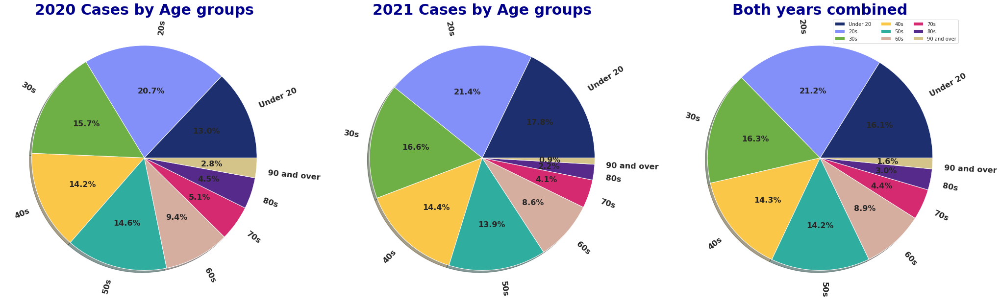

In [ ]:
# creating a grid with pie plots of summary
gridspec.GridSpec(1,3)
label = ['Under 20','20s','30s','40s','50s','60s','70s','80s','90 and over']
color = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748','#2FAE9F','#D5AE9F','#D52A70','#552A8A','#D4C48A']
fig = plt.figure(figsize=(35,40))
plt.subplot2grid((1,3),(0,0))
plt.pie(x='case_count', labels=label, data = age_cases_2020_grouped_df, textprops= {'fontsize':16,'fontweight':'bold'}, rotatelabels=30, autopct='%1.1f%%', shadow=True, colors=color)
plt.title("2020 Cases by Age groups", fontdict={'fontsize':30,'fontweight':'bold','color':'darkblue'})

plt.subplot2grid((1,3),(0,1))
plt.pie(x='case_count', labels=label, data = age_cases_2021_grouped_df, textprops= {'fontsize':16,'fontweight':'bold'}, rotatelabels=20, autopct='%1.1f%%', shadow=True, colors=color)
plt.title("2021 Cases by Age groups", fontdict={'fontsize':30,'fontweight':'bold','color':'darkblue'})

plt.subplot2grid((1,3),(0,2))
plt.pie(x='case_count', labels=label, data = age_cases_both_grouped_df, textprops= {'fontsize':16,'fontweight':'bold'}, rotatelabels=45, autopct='%1.1f%%', shadow=True, colors=color)
plt.title("Both years combined", fontdict={'fontsize':30,'fontweight':'bold','color':'darkblue'})

plt.legend(loc='upper right', ncol=3)
plt.show()

**Age group frequency processing**

In [ ]:
# creating a data frequency frame that counts age category frequency 
age_cat_frq_df_2020 = confirmed_cases_age_grp_2020_df['age_category'].value_counts().sort_index().to_frame()
age_cat_frq_df_2020

,age_category
12-19,634
20-29,669
30-39,663
40-49,662
50-59,641
60-69,637
70-79,597
80-89,552
90+,479


In [ ]:
age_cat_frq_df_2020['normalized_freq'] = confirmed_cases_age_grp_2020_df['age_category'].value_counts(normalize=True)*100

age_cat_frq_df_2020['cummulative_freq'] = age_cat_frq_df_2020['normalized_freq'].cumsum()

age_cat_frq_df_2020



,age_category,normalized_freq,cummulative_freq
12-19,634,11.456451,11.456451
20-29,669,12.088905,23.545356
30-39,663,11.980484,35.525840
40-49,662,11.962414,47.488254
50-59,641,11.582942,59.071196
60-69,637,11.510661,70.581858
70-79,597,10.787857,81.369714
80-89,552,9.974702,91.344416
90+,479,8.655584,100.000000


In [ ]:
age_cat_frq_df_2021 = confirmed_cases_age_grp_2021_df['age_category'].value_counts().sort_index().to_frame()
age_cat_frq_df_2021

,age_category
12-19,539
20-29,565
30-39,554
40-49,524
50-59,525
60-69,490
70-79,447
80-89,424
90+,357


In [ ]:
age_cat_frq_df_2021['normalized_freq'] = confirmed_cases_age_grp_2021_df['age_category'].value_counts(normalize=True)*100

age_cat_frq_df_2021['cummulative_freq'] = age_cat_frq_df_2021['normalized_freq'].cumsum()

age_cat_frq_df_2021


,age_category,normalized_freq,cummulative_freq
12-19,539,12.180791,12.180791
20-29,565,12.768362,24.949153
30-39,554,12.519774,37.468927
40-49,524,11.841808,49.310734
50-59,525,11.864407,61.175141
60-69,490,11.073446,72.248588
70-79,447,10.101695,82.350282
80-89,424,9.581921,91.932203
90+,357,8.067797,100.000000


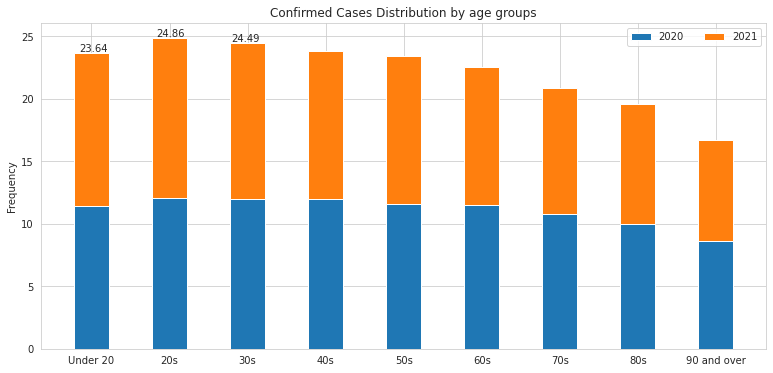

In [ ]:
label = ['Under 20','20s','30s','40s','50s','60s','70s','80s','90 and over']
width= 0.45
err_2020 = age_cat_frq_df_2020['normalized_freq'].max()
err_2021 = age_cat_frq_df_2021['normalized_freq'].max()
pltx=0

fig, ax = plt.subplots(1, figsize=(13,6))

ax.bar(x=label, height=age_cat_frq_df_2020['normalized_freq'], width=width, label='2020')
ax.bar(x=label, height=age_cat_frq_df_2021['normalized_freq'], width=width, bottom=age_cat_frq_df_2020['normalized_freq'], label='2021')

ax.set_ylabel('Frequency')
ax.set_title('Confirmed Cases Distribution by age groups')
ax.legend(loc='upper right', ncol = 2)

plt.annotate("23.64",(38,297.24), xycoords='axes points')
plt.annotate("24.86",(115,312), xycoords='axes points')
plt.annotate("24.49",(190,307), xycoords='axes points')

plt.show()

**`CONCLUSION:`**
- 99.14% percent of the age groups of positive cases were accurately provided and used in this analysis.
- Based on that data, it can be observed that young adults, in their 20s, were the population with the most number of positive covid cases in ontario.

**`Sub-question 2:`**
What percentage of the affected popultion were under 70 years in both years of the pandemic

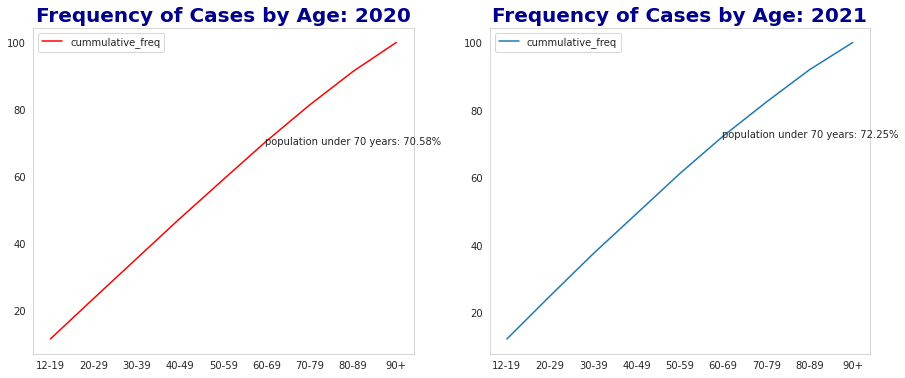

In [ ]:
gridspec.GridSpec(1,2)
fig = plt.figure(figsize=(15,6)) 

plt.subplot2grid((1,2),(0,0))
age_cat_frq_df_2020['cummulative_freq'].plot(color='r')
plt.title("Frequency of Cases by Age: 2020", fontdict={'fontsize':20,'fontweight':'bold','color':'darkblue'}) 
plt.annotate("population under 70 years: 70.58%", (231.79,209.2), xycoords='axes points')
plt.legend(loc='upper left')
plt.grid()

plt.subplot2grid((1,2),(0,1))
age_cat_frq_df_2021['cummulative_freq'].plot()
plt.title("Frequency of Cases by Age: 2021", fontdict={'fontsize':20,'fontweight':'bold','color':'darkblue'})
plt.annotate("population under 70 years: 72.25%", (231.98,216.5), xycoords='axes points') 
plt.legend(loc='upper left')
plt.grid()

plt.show()

**`CONCLUSION:`**
- Based on that data, in 2020, it was observed that about 70.58% of people affected by covid were under 70.
- In 2021, approximately 72.25% of people affected by covid were under 70years of age.

### **`Question 4:`**
How does the proportion of affected groups compare with the those getting vaccinated?

In [ ]:
# frequency of those getting vaccinated vs those affected. 
# create age_bin for vaccination data that for those less than 19 - so it matches
vacc_data_ts_df.head(10)

,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
date,,,,,,
2020-12-16 00:00:00-05:00,12-17yrs,0,0,951519,0.0,0.0
2020-12-16 00:00:00-05:00,18-29yrs,45,0,2455535,0.0,0.0
2020-12-16 00:00:00-05:00,30-39yrs,66,0,2056059,0.0,0.0
2020-12-16 00:00:00-05:00,40-49yrs,98,0,1876583,0.0,0.0
2020-12-16 00:00:00-05:00,50-59yrs,141,0,2060934,0.0,0.0
2020-12-16 00:00:00-05:00,60-69yrs,65,0,1795046,0.0,0.0
2020-12-16 00:00:00-05:00,70-79yrs,15,0,1159902,0.0,0.0
2020-12-16 00:00:00-05:00,80+,0,0,679266,0.0,0.0
2020-12-17 00:00:00-05:00,12-17yrs,0,0,951519,0.0,0.0


In [ ]:
# creating a copy of timeseries df for processing
vacc_data_ts_processing_df = vacc_data_ts_df.copy()
vacc_data_ts_processing_df.head(10)

,age_group,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
date,,,,,,
2020-12-16 00:00:00-05:00,12-17yrs,0,0,951519,0.0,0.0
2020-12-16 00:00:00-05:00,18-29yrs,45,0,2455535,0.0,0.0
2020-12-16 00:00:00-05:00,30-39yrs,66,0,2056059,0.0,0.0
2020-12-16 00:00:00-05:00,40-49yrs,98,0,1876583,0.0,0.0
2020-12-16 00:00:00-05:00,50-59yrs,141,0,2060934,0.0,0.0
2020-12-16 00:00:00-05:00,60-69yrs,65,0,1795046,0.0,0.0
2020-12-16 00:00:00-05:00,70-79yrs,15,0,1159902,0.0,0.0
2020-12-16 00:00:00-05:00,80+,0,0,679266,0.0,0.0
2020-12-17 00:00:00-05:00,12-17yrs,0,0,951519,0.0,0.0


In [ ]:
# group cases by category and take sum
vacc_data_ts_grp_df = vacc_data_ts_processing_df.groupby('age_group')[vacc_data_ts_processing_df.columns].sum()
vacc_data_ts_grp_df.head(10)

,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated
age_group,,,,,
12-17yrs,23735994,3112029,203625066,24.9341,3.2497
18-29yrs,102561542,24133285,525484490,41.7673,9.8278
30-39yrs,98470705,26377414,439996626,47.8898,12.8317
40-49yrs,105864318,28195748,401588762,56.4182,15.0196
50-59yrs,134293555,36025148,441039876,65.1575,17.4805
60-69yrs,147872652,39771981,384139844,82.3710,22.1535
70-79yrs,110251575,30752709,248219028,95.0442,26.5066
80+,80772705,30822160,145362924,118.9125,45.3794
Adults_18plus,0,0,0,0.0000,0.0000


In [ ]:
# remove unused rows - they were removed from data during cleaning so value is 0
vacc_data_ts_grp_df.drop(index=['Adults_18plus','Ontario_12plus','Undisclosed_or_missing'],inplace=True)

In [ ]:
# creating columns to hold fraction of partially & fully vaccinated population before grouping
vacc_data_ts_grp_df['%_of_partial_across_groups'] = vacc_data_ts_grp_df['partially_vaccinated']/vacc_data_ts_grp_df['partially_vaccinated'].sum()*100
vacc_data_ts_grp_df['%_of_full_across_groups'] = vacc_data_ts_grp_df['fully_vaccinated']/vacc_data_ts_grp_df['fully_vaccinated'].sum() * 100
vacc_data_ts_grp_df.head(3)

,partially_vaccinated,fully_vaccinated,total_population,%_partially_vaccinated,%_fully_vaccinated,%_of_partial_across_groups,%_of_full_across_groups
age_group,,,,,,,
12-17yrs,23735994,3112029,203625066,24.9341,3.2497,2.952888,1.419783
18-29yrs,102561542,24133285,525484490,41.7673,9.8278,12.759219,11.010189
30-39yrs,98470705,26377414,439996626,47.8898,12.8317,12.250296,12.034015


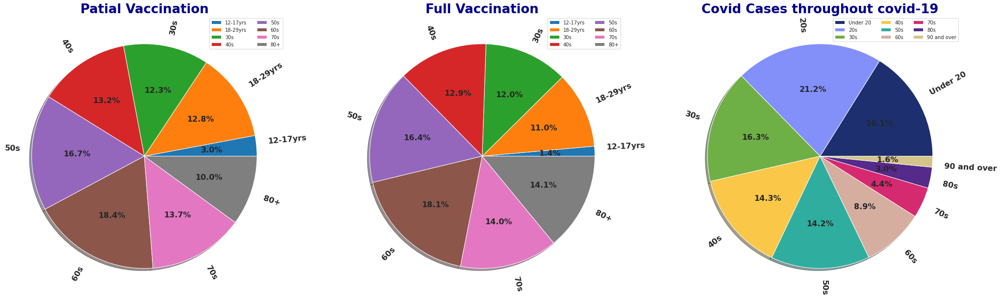

In [ ]:
# creating a grid with pie plots of summary
gridspec.GridSpec(1,3)
label_cases = ['Under 20','20s','30s','40s','50s','60s','70s','80s','90 and over']
label_vacc = ['12-17yrs','18-29yrs','30s','40s','50s','60s','70s','80+']
color = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748','#2FAE9F','#D5AE9F','#D52A70','#552A8A','#D4C48A']

fig = plt.figure(figsize=(35,30))
plt.subplot2grid((1,3),(0,0))
plt.pie(x='partially_vaccinated', labels=label_vacc, data = vacc_data_ts_grp_df, textprops= {'fontsize':16,'fontweight':'bold'}, rotatelabels=35, autopct='%1.1f%%', shadow=True)
plt.title("Patial Vaccination", fontdict={'fontsize':26,'fontweight':'bold','color':'darkblue'})
plt.legend(loc='upper right', ncol=2)

plt.subplot2grid((1,3),(0,1))
plt.pie(x='fully_vaccinated', labels=label_vacc, data = vacc_data_ts_grp_df, textprops= {'fontsize':16,'fontweight':'bold'}, rotatelabels=45, autopct='%1.1f%%', shadow=True)
plt.title("Full Vaccination", fontdict={'fontsize':26,'fontweight':'bold','color':'darkblue'})
plt.legend(loc='upper right', ncol=2)

plt.subplot2grid((1,3),(0,2))
plt.pie(x='case_count', labels=label_cases, data = age_cases_both_grouped_df, textprops= {'fontsize':16,'fontweight':'bold'}, rotatelabels=45, autopct='%1.1f%%', shadow=True, colors=color)
plt.title("Covid Cases throughout covid-19", fontdict={'fontsize':26,'fontweight':'bold','color':'darkblue'})

plt.legend(loc='upper right', ncol=3)
plt.show()

**`Conclusion`**
While cases are higher with the younger population, vaccination efforts have a higher spread amongst the older population. This might potential slow down the province's rate of overcoming the pandemic

### **`Question 5:`**
How has the pandemic impacted the community's mobility?  Is there an observable effect on the number of cases in the province?

In [ ]:
# trend of cases to mobility data
# uses cases on a smaller scale like per 100 or per 1000

In [ ]:
ontariocovid_vaccine_processing_df = ontariocovid_vaccine_ts_df.copy()
ontariocovid_vaccine_processing_df.head(2)

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted
2020-01-25 00:00:00-05:00,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2020-01-26 00:00:00-05:00,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0


In [ ]:
ontariocovid_vaccine_processing_df['cases_moving_average'] = ontariocovid_vaccine_processing_df['change_cases'].rolling(window=30).mean()
ontariocovid_vaccine_processing_df.head(2)

,change_cases,change_fatalities,change_tests,change_hospitalizations,change_criticals,change_recoveries,change_vaccinations,change_vaccinated,change_vaccines_distributed,total_cases,total_fatalities,total_tests,total_hospitalizations,total_criticals,total_recoveries,total_vaccinations,total_vaccinated,total_vaccines_distibuted,cases_moving_average
2020-01-25 00:00:00-05:00,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,NaN
2020-01-26 00:00:00-05:00,1,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,NaN


In [ ]:
mobility_processing_df = mobility_ts_df.copy()
mobility_processing_df.head(2)

,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
2020-02-15 00:00:00-05:00,6.234043,4.340426,12.851064,14.744681,1.638298,-0.617021
2020-02-16 00:00:00-05:00,15.234043,14.085106,19.680851,4.085106,-1.468085,-1.212766


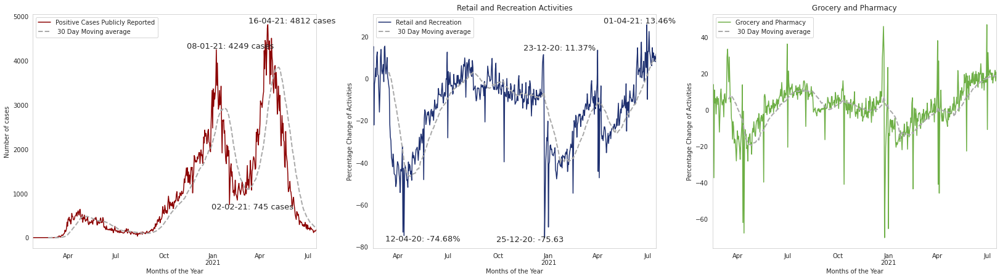

In [ ]:
# creating a grid plot to compare daily cases with % change from base line
# focus is given more to 2021 as mobility data is for 2021
gridspec.GridSpec(1,3)

fig = plt.figure(figsize=(28,7))
plt.subplot2grid((1,3),(0,0))
ontariocovid_vaccine_processing_df['change_cases'].plot(color='darkred', label='Positive Cases Publicly Reported')
ontariocovid_vaccine_processing_df['cases_moving_average'].plot(color='darkgray', linestyle='dashed', label=' 30 Day Moving average', linewidth=2)
plt.annotate("08-01-21: 4249 cases", (250,325), xycoords='axes pixels', size=13)
plt.annotate("16-04-21: 4812 cases", (350,365.89), xycoords='axes pixels', size=13)
plt.annotate("02-02-21: 745 cases", (290,63.89), xycoords='axes pixels', size=13)
plt.ylabel('Number of cases')
plt.xlabel('Months of the Year')
plt.grid(axis='both')
plt.legend()

plt.subplot2grid((1,3),(0,1))
mobility_processing_df['retail_and_recreation_percent_change_from_baseline'].plot(color='#1D2F6F', label ='Retail and Recreation')
mobility_processing_df['retail_and_recreation_percent_change_from_baseline'].rolling(window=30).mean().plot(color='darkgray', linestyle='dashed',label=' 30 Day Moving average', linewidth=2)
plt.annotate("12-04-20: -74.68%",(20.67,11.99), xycoords='axes pixels', size=13)
plt.annotate("23-12-20: 11.37%", (244,321.92), xycoords='axes pixels', size=13)
plt.annotate("25-12-20: -75.63",(200.67,10.99), xycoords='axes pixels', size=13)
plt.annotate("01-04-21: 13.46%", (374.4,365.89), xycoords='axes pixels', size=13)
plt.ylabel('Percentage Change of Activities')
plt.xlabel('Months of the Year')
plt.title("Retail and Recreation Activities")
plt.grid(axis='both')
plt.legend()

plt.subplot2grid((1,3),(0,2))
mobility_processing_df['grocery_and_pharmacy_percent_change_from_baseline'].plot(color='#6EAF46', label='Grocery and Pharmacy')
mobility_processing_df['grocery_and_pharmacy_percent_change_from_baseline'].rolling(window=30).mean().plot(color='darkgray', linestyle='dashed',label=' 30 Day Moving average', linewidth=2)
plt.ylabel('Percentage Change of Activities')
plt.xlabel('Months of the Year')
plt.title("Grocery and Pharmacy")
plt.grid(axis='both')
plt.legend()


plt.show()

# color = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748','#2FAE9F','#D5AE9F','#D52A70','#552A8A','#D4C48A', '#F4DABD']

In [ ]:
# mobility_2021_processing_df.loc['2021-03-30':'2021-04-03','retail_and_recreation_percent_change_from_baseline']

**`Observation`**

- Although Ontario publicly reported it's first case as of [January 25th](https://globalnews.ca/news/6859636/ontario-coronavirus-timeline/), the rates of progression became more obvious in March and the province recorded it's first death in the same month.

- Ontario experienced it's first highest number of Cases per day  on the 8th of January 2021 where 4249 people were reported to have tested positive. It then experienced a gradual decline with some and saw as low as only 745 positive cases on 2021-02-02. Although there were fluctuations in cases, it stayed under 2000 until 2021-03-25 with 2380 cases, then progressed gradually until the next peak on the 16th of April 2021 (4812 cases) - based on the data collected as of 17th July, 2021. 

- Retail and recreation have experienced more of a decline from the baseline that it has exceeded in 2021. This can possibly be attributed to the stay-at-home orders and states of emergency declarations that have limited people from moving freely and businesses from being open.

- Although grocery and pharmacies have been exempted from most operational restrictions like closure, there has been some sudden peaks and dips but movement has stayed fairly consistent around the baseline with +-23% changes

</br>
</br>

-----
**`ADDITIONAL NOTE ON TIMELINES`**


---


- Shortly after that, a state of emergency was declared and the non-essential movements were regulated as of Mar. 17th. 

- May 11, 2020: residents were allowed to walk, hike, bike and bird watch in provincial parks. Camping and access to beaches will remain closed.

- May 16, 2020: Some businesses open: including campgrounds, marinas and golf courses. 

- Jul 31, 2020: Province was open again.

- Sep. 8, 2020: pause on loosening any more restrictions.

-  Sept. 28, 2020: Restrictions started getting tightened and it was announced that the province was officially in the second wave of the pandemic.

- Sep. 30, 2020: the province could see upwards of 1,000 cases a day in October, as the second wave is in full swing (Health officials).

- Oct. 9, 2020: closure of indoor activities

- Feb. 16 and 19, 2021: first set of provinces go out of lockdown except Toronto, Peel Region and North Bay-Parry Sound - for 2 weeks more (Mar. 2).

- Apr. 7, 2021: The Ford government declares the province’s third state of emergency amid the COVID-19 pandemic and is issuing a provincewide stay-at-home order. The order will last for four weeks.

- June 11, latest [reopening](https://www.cbc.ca/news/canada/toronto/covid-19-ontario-june-7-2021-1.6055955)



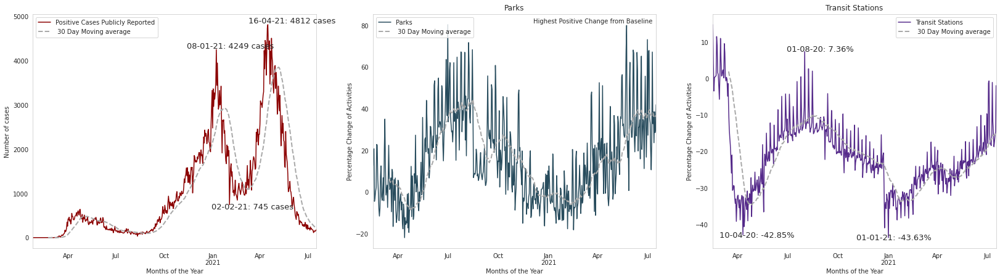

In [ ]:
gridspec.GridSpec(1,3)

fig = plt.figure(figsize=(28,7))
plt.subplot2grid((1,3),(0,0))
ontariocovid_vaccine_processing_df['change_cases'].plot(color='darkred', label='Positive Cases Publicly Reported')
ontariocovid_vaccine_processing_df['cases_moving_average'].plot(color='darkgray', linestyle='dashed', label=' 30 Day Moving average', linewidth=2)
plt.annotate("08-01-21: 4249 cases", (250,325), xycoords='axes pixels', size=13)
plt.annotate("16-04-21: 4812 cases", (350,365.89), xycoords='axes pixels', size=13)
plt.annotate("02-02-21: 745 cases", (290,63.89), xycoords='axes pixels', size=13)
plt.ylabel('Number of cases')
plt.xlabel('Months of the Year')
plt.grid(axis='both')
plt.legend()

plt.subplot2grid((1,3),(0,1))
mobility_processing_df['parks_percent_change_from_baseline'].plot(color='#284C5D', label ='Parks')
mobility_processing_df['parks_percent_change_from_baseline'].rolling(window=30).mean().plot(color='darkgray', linestyle='dashed',label=' 30 Day Moving average', linewidth=2)
plt.annotate("Highest Positive Change from Baseline", (260.4,365.89), xycoords='axes pixels')
plt.ylabel('Percentage Change of Activities')
plt.xlabel('Months of the Year')
plt.title("Parks")
plt.grid(axis='both')
plt.legend(loc='upper left')

plt.subplot2grid((1,3),(0,2))
mobility_processing_df['transit_stations_percent_change_from_baseline'].plot(color='#552A8A', label='Transit Stations')
mobility_processing_df['transit_stations_percent_change_from_baseline'].rolling(window=30).mean().plot(color='darkgray', linestyle='dashed',label=' 30 Day Moving average', linewidth=2)
plt.annotate("10-04-20: -42.85%", (10.67,17.43), xycoords='axes pixels',size=13)
plt.annotate("01-08-20: 7.36%", (120,319.99), xycoords='axes pixels', size=13)
plt.annotate("01-01-21: -43.63%", (232.5,13.88), xycoords='axes pixels', size=13)
plt.ylabel('Percentage Change of Activities')
plt.xlabel('Months of the Year')
plt.title("Transit Stations")
plt.grid(axis='both')
plt.legend()


plt.show()

# 
# color = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748','#2FAE9F','#D5AE9F','#D52A70','#552A8A','#D4C48A', '#F4DABD']

**`Observation`**

- Movements to the parks experrienced a decline early in the year, which is typically expected due to weather condition at the time. However, more drops below the baseline were experienced in March, leading up to the early parts of april, then it increased above the baseline as restrictions eased in the province. A similar fluctuating pattern can be observed throughout the period being analyzed.

- For transit stations have seen less people movements. Although alot of fluctuations have been observed, it has consistently been below the baseline. 

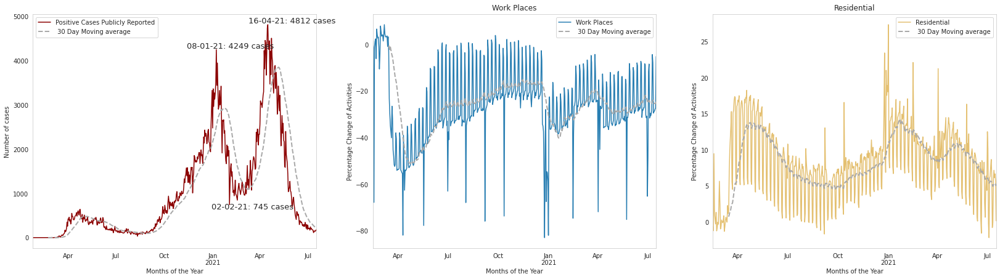

In [ ]:
gridspec.GridSpec(1,3)

fig = plt.figure(figsize=(28,7))
plt.subplot2grid((1,3),(0,0))
ontariocovid_vaccine_processing_df['change_cases'].plot(color='darkred', label='Positive Cases Publicly Reported')
ontariocovid_vaccine_processing_df['cases_moving_average'].plot(color='darkgray', linestyle='dashed', label=' 30 Day Moving average', linewidth=2)
plt.annotate("08-01-21: 4249 cases", (250,325), xycoords='axes pixels', size=13)
plt.annotate("16-04-21: 4812 cases", (350,365.89), xycoords='axes pixels', size=13)
plt.annotate("02-02-21: 745 cases", (290,63.89), xycoords='axes pixels', size=13)
plt.ylabel('Number of cases')
plt.xlabel('Months of the Year')
plt.grid(axis='both')
plt.legend()

plt.subplot2grid((1,3),(0,1))
mobility_processing_df['workplaces_percent_change_from_baseline'].plot(color='#287EB2', label ='Work Places')
mobility_processing_df['workplaces_percent_change_from_baseline'].rolling(window=30).mean().plot(color='darkgray', linestyle='dashed',label=' 30 Day Moving average', linewidth=2)
plt.ylabel('Percentage Change of Activities')
plt.xlabel('Months of the Year')
plt.title("Work Places")
plt.grid(axis='both')
plt.legend()

plt.subplot2grid((1,3),(0,2))
mobility_processing_df['residential_percent_change_from_baseline'].plot(color='#E4C071', label='Residential')
mobility_processing_df['residential_percent_change_from_baseline'].rolling(window=30).mean().plot(color='darkgray', linestyle='dashed',label=' 30 Day Moving average', linewidth=2)
plt.ylabel('Percentage Change of Activities')
plt.xlabel('Months of the Year')
plt.title("Residential")
plt.grid(axis='both')
plt.legend()


plt.show()

# 	
# color = ['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748','#2FAE9F','#D5AE9F','#D52A70','#552A8A','#D4C48A', '#F4DABD']

**`Observation`**

- Although movement to workplaces was a little above the baseline early in March, a state of emergency was declared in the province on March 17th and it's effects can be observed as movements to workplaces dropped. Workplace-related movements have remained under the baseline throughout the pandemic. This can be attributable to the prolonged restrictions and the the fact that most workers who are able to fulfill the job responsibilities from home are working remotely.

- Residential movements have stayed above the baseline almost all throughout the pandemic and experienced few occassional drops below the baseline.

**`Conclusion`**

- Despite activities slowing down and the preventative measures adopted by he government, the number of cases in the province continued to rise and saw it's two major peaks during the goevernment imposed stay-at-home order.

### **`Conclusions from exploratory analysis`**

- The data shows that there is correlation between covid activties and the preventive solution - vaccinations. Although levels of correlation differ, total cases has a positive correlation with the totals of other activities. 
    - Total cases  vs Total fatalities has a correlation of ~0.96
    - Total cases  vs Total tests has a correlation of ~0.98
    - Total cases  vs Total hospitalizations has a correlation of ~0.50
    - Total cases  vs Total criticals has a correlation of ~0.79
    - Total cases  vs Total recoveries has a correlation of ~0.99
    - Total cases  vs Partial vaccinations has a correlation of ~0.83
    - Total cases  vs Full vaccinations has a correlation of ~0.60
    - Total cases  vs Vaccines distributed has a correlation of ~0.83
- While there is a very low correlation between the days of the week and total cases in ontario, a bar plot shows that the daily number of cases tends to differ across the different days of the week. Daily changes in covid cases seem to rises on Thursday into the weekend, fluctuates between saturday to sunday and makes a U-shaped movement between Monday and Wednesday. From the data, Friday, April 16 2021, is the day with the highest number of cases.

- Furthermore, although the older population in Ontario are said to have a higher risk of contracting the virus, the data shows that there is a higher number of people testing positive amongst young adults in their 20s and 30s. Findings are based on only 99.14% collected as some rows were lost during data cleaning.

- Despite cases being higher amongst the younger population, as of July 17-2021,preventive (vaccination) efforts had a higher spread amongst the older population. If events progress at this rate, it will likely slow down the speed with which the province overcomes the pandemic.

- Additionally, irrespective of activities slowing down and the preventative measures, such as full lockdowns and restricted movements, adopted by the government, the number of cases in the province has continued to rise. It can also be noted that daily change in cases saw it's two major peaks during the goevernment imposed stay-at-home order.

### **`Recommendations:`**
In the event of future pandemics, to overcome it's impact faster, it is recommended that Ontario;
- expands vaccination opportunities to include the younger demographic as this can potentially reduces the number of cases and prologned spread in the province.
- Continue large scale public education on hygiene measures such as; washing hands, wearing masks, sanitizing shared spaces etc, to minimize each individual's chances of contracting the virus.
- Analyse the impact of mobility restriction measures periodically to determine how viable that solution is. If cases tend to increase drastically at the end of lockdowns, it might be due to asymtomatic carriers suddenly mixing up with others whenever some degree of freedom is allowed. 
- Explore limiting capacity as opposed to full lockdowns during a pandemic. This would likely decrease the sudden excitement for everyone to be outside at the same time and would increase the possibility of knowing who was where and when. E.g: via the barcode registrations required by some enclosed spaces presently.


## Data Modelling

**`Predicting daily total covid cases in Ontario:`**


**Null hypothesis:** There is no correlation between the features and variables in the dataset i.e. correlation coefficients of features and target variable is zero

**Alternative hypothesis:** There is linear correlation of 0.75 and over between features and the prediction target in the data.


### **`Using Linear Regression and statsmodel - OLS:`**

**`Note`**: Test_train_split was used for generating training and validation data

In [ ]:
# creating total_cases df with features that have > 0.75 correlation to total_cases

# first - get the columns where correlation > 0.75
'''
Displays a list of columns that meet or exceed your specified correlation limit for linear regression

    df: main data frame

    map_column: this column would be used to check how other columns correlate with it

    corr_limit: The mimimum degree/value to which the other column should correlate to the map_column

'''
collist = []
def get_cols_that_meet_corr_limit(df, map_column, corr_limit):
  i = 0
  for cols in df.columns:
    if df[map_column].corr(df[cols], method='pearson') >= corr_limit:
      print(f"{cols}: {df[map_column].corr(df[cols], method='pearson')}")
      collist.append(cols)
      i += 1
  print("\n\nYou can apply the above columns to your df using 'collist'. \nSyntax: df[collist]")


In [ ]:
get_cols_that_meet_corr_limit(ontariocovid_vaccine_ts_df, 'total_cases', 0.75)

change_vaccinations: 0.8881474290199122
total_cases: 1.0
total_fatalities: 0.9620482022491745
total_tests: 0.9776739655614066
total_criticals: 0.7898145037222213
total_recoveries: 0.9987566183371788
total_vaccinations: 0.8262349709082729
total_vaccines_distibuted: 0.826501275808854


You can apply the above columns to your df using 'collist'. 
Syntax: df[collist]


In [ ]:
# create df 
tc_prediction_df = ontariocovid_vaccine_ts_df[collist] 
tc_prediction_df.head(3)

,change_vaccinations,total_cases,total_fatalities,total_tests,total_criticals,total_recoveries,total_vaccinations,total_vaccines_distibuted
2020-01-25 00:00:00-05:00,0,1,0,0,0,0,0,0
2020-01-26 00:00:00-05:00,0,2,0,0,0,0,0,0
2020-01-27 00:00:00-05:00,0,2,0,0,0,0,0,0


In [ ]:
# defining features for model
features = tc_prediction_df.drop(columns=['total_fatalities','total_recoveries','total_cases','total_criticals','total_vaccinations','total_vaccines_distibuted'])
features.head()

,change_vaccinations,total_tests
2020-01-25 00:00:00-05:00,0,0
2020-01-26 00:00:00-05:00,0,0
2020-01-27 00:00:00-05:00,0,0
2020-01-28 00:00:00-05:00,0,0
2020-01-29 00:00:00-05:00,0,0


In [ ]:
# define prediction target 
target_prediction = tc_prediction_df['total_cases']

In [ ]:
# verifying that the featture matrix and precition variables are of equal length
print(len(features))
print(len(target_prediction))

540
540


In [ ]:
# split data
# put Xs together then Ys together - so that the split maps to features and target_pred. correctly

X_train, X_test, y_train, y_test = train_test_split(features, target_prediction, test_size=0.30, random_state=0)

In [ ]:
#  using Linear Regression - create and fit model
model_tc = LinearRegression()
model_tc.fit(X_train,y_train)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
# getting the model parameters - beta_0 and beta_1
print(f"The y_intercept of the model (beta_0) is: {model_tc.intercept_:.5f}")
print(f"The slopes of the model (beta_1) are: \n{model_tc.coef_[0]:.5f}: for changes_vaccination \n{model_tc.coef_[1]:.5f}: for total tests")

The y_intercept of the model (beta_0) is: -11860.45354
The slopes of the model (beta_1) are: 
0.79914: for changes_vaccination 
0.02542: for total tests


In [ ]:
# assessing accuracy of the model
print(f"The model score on the training data is: {model_tc.score(X_train, y_train):.3f}")

The model score on the training data is: 0.982


In [ ]:
# verifying that the featture matrix and precition variables are of equal length
print(len(X_test))
print(len(y_test))

162
162


In [ ]:
# testing the model on the 30% of the sample size
lin_model_pred_df = X_test.copy()
lin_model_pred_df['total_cases'] = y_test


In [ ]:
lin_model_pred_df['predicted_total_cases'] = np.round(model_tc.predict(X_test)).astype(int)
lin_model_pred_df.iloc[120:130]

,change_vaccinations,total_tests,total_cases,predicted_total_cases
2020-12-01 00:00:00-05:00,0,6309556,118199,148559
2020-11-05 00:00:00-05:00,0,5264568,80690,121990
2021-05-05 00:00:00-04:00,132603,14310628,479633,457954
2021-02-08 00:00:00-05:00,6987,10054325,279472,249353
2020-08-08 00:00:00-04:00,0,2372441,39967,48459
2020-12-08 00:00:00-05:00,0,6665787,130910,157616
2021-07-15 00:00:00-04:00,166201,16282312,547705,534934
2020-05-17 00:00:00-04:00,0,544826,22653,1992
2020-10-22 00:00:00-04:00,0,4785832,67527,109819
2020-02-01 00:00:00-05:00,0,0,3,-11860


In [ ]:
# assessing actual cases vs predicted cases using accuracy and error metrics
print(f"The measure of accuracy for the model using r-squared is: {r2_score(lin_model_pred_df['total_cases'], lin_model_pred_df['predicted_total_cases']):.4f}")
print(f"The mean absolute error for the model is: {mean_absolute_error(lin_model_pred_df['total_cases'], lin_model_pred_df['predicted_total_cases']):.2f}")
print(f"The mean squared error for the model is: {mean_squared_error(lin_model_pred_df['total_cases'], lin_model_pred_df['predicted_total_cases']):.2f}")

The measure of accuracy for the model using r-squared is: 0.9815
The mean absolute error for the model is: 22187.13
The mean squared error for the model is: 686918812.52


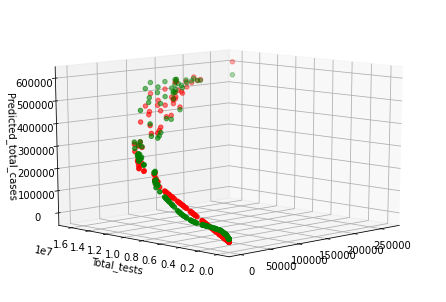

In [ ]:
fig3d = m3d.Axes3D(plt.figure())
fig3d.set_ylabel('Total_tests')
fig3d.set_zlabel('Predicted_total_cases')
fig3d.view_init(12, 225)
fig3d.scatter3D(xs=lin_model_pred_df['change_vaccinations'], ys=lin_model_pred_df['total_tests'], zs= lin_model_pred_df['total_cases'] , color = 'green')
fig3d.scatter3D(xs=lin_model_pred_df['change_vaccinations'], ys=lin_model_pred_df['total_tests'], zs= lin_model_pred_df['predicted_total_cases'] , color = 'red')

plt.show();

In [ ]:
# confirming model using statsmodels
import pandas.util.testing as tm
import statsmodels.formula.api as smf

tc_ml_stats_df = smf.ols("total_cases ~ total_tests  + change_vaccinations", data=ontariocovid_vaccine_ts_df) 
# tc_ml_stats_df = smf.ols("total_fatalities ~ total_cases + total_tests + total_recoveries", data=ontariocovid_vaccine_ts_df) 

output = tc_ml_stats_df.fit()

output.summary()
# diamond_reg_cut.summary()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            total_cases   R-squared:                       0.982
Model:                            OLS   Adj. R-squared:                  0.982
Method:                 Least Squares   F-statistic:                 1.462e+04
Date:                Sun, 05 Sep 2021   Prob (F-statistic):               0.00
Time:                        16:03:12   Log-Likelihood:                -6238.7
No. Observations:                 540   AIC:                         1.248e+04
Df Residuals:                     537   BIC:                         1.250e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -1.211e+04   1769.940     -6.844      0.000   -1.56e+04   -8635.777
total_tests             0.0254      0.000     75.841      0.000       0.025       0.026
change_vaccinations     0.8358      0.030     27.889      0.000       0.777       0.895
==============================================================================
Omnibus:                        2.440   Durbin-Watson:                   0.225
Prob(Omnibus):                  0.295   Jarque-Bera (JB):                2.515
Skew:                          -0.157   Prob(JB):                        0.284
Kurtosis:                       2.883   Cond. No.                     1.36e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.36e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### **`Using Decision Tree Regressor and Random Forest Regressor:`**

In [ ]:
# using --- DECISION TREE REGRESSOR ------
dt_model = DecisionTreeRegressor(criterion='mse', max_depth=5, random_state=0)
dt_model.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=5,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [ ]:
print(f"The decision tree regressor model score is: {dt_model.score(X_train, y_train):.4f}")    # getting model score

The decision tree regressor model score is: 0.9995


In [ ]:
dt_lin_pred_df = lin_model_pred_df.copy()
dt_lin_pred_df.head(2)

,change_vaccinations,total_tests,total_cases,predicted_total_cases
2020-04-05 00:00:00-04:00,0,75046,4038,-9952
2021-02-19 00:00:00-05:00,16967,10588786,290771,270917


In [ ]:
dt_lin_pred_df['dt_predicted_total_cases'] = np.round(dt_model.predict(X_test)).astype(int)
dt_lin_pred_df.head()

,change_vaccinations,total_tests,total_cases,predicted_total_cases,dt_predicted_total_cases
2020-04-05 00:00:00-04:00,0,75046,4038,-9952,6071
2021-02-19 00:00:00-05:00,16967,10588786,290771,270917,283075
2021-06-01 00:00:00-04:00,120195,15242915,532158,471742,534608
2020-09-14 00:00:00-04:00,0,3342138,44817,73113,41744
2020-06-13 00:00:00-04:00,0,980471,31992,13068,31818


In [ ]:
# assessing actual cases vs predicted cases using accuracy and error metrics
print(f"The measure of accuracy for the decision tree model using r-squared is: {r2_score(dt_lin_pred_df['total_cases'], dt_lin_pred_df['dt_predicted_total_cases']):.4f}")
print(f"The mean absolute error for the decision tree model is: {mean_absolute_error(dt_lin_pred_df['total_cases'], dt_lin_pred_df['dt_predicted_total_cases']):.4f}")
print(f"The mean squared error for the decision tree model is: {mean_squared_error(dt_lin_pred_df['total_cases'], dt_lin_pred_df['dt_predicted_total_cases']):.4f}")

The measure of accuracy for the decision tree model using r-squared is: 0.9991
The mean absolute error for the decision tree model is: 4190.6173
The mean squared error for the decision tree model is: 34939382.6914


In [ ]:
# EXPLORING ---  the prediction with RANDOM FOREST REGRESSOR
from sklearn.ensemble import RandomForestRegressor 
rf_model = RandomForestRegressor(max_depth=5, random_state=0).fit(X_train, y_train)
rf_model.score(X_train, y_train)

0.99989954792897

In [ ]:
rf_lin_pred_df = dt_lin_pred_df.copy()
rf_lin_pred_df.head(2)

,change_vaccinations,total_tests,total_cases,predicted_total_cases,dt_predicted_total_cases
2020-04-05 00:00:00-04:00,0,75046,4038,-9952,6071
2021-02-19 00:00:00-05:00,16967,10588786,290771,270917,283075


In [ ]:
rf_lin_pred_df['rf_predicted_total_cases'] = np.round(rf_model.predict(X_test)).astype(int)
rf_lin_pred_df.tail()

,change_vaccinations,total_tests,total_cases,predicted_total_cases,dt_predicted_total_cases,rf_predicted_total_cases
2021-05-19 00:00:00-04:00,145461,14856381,514690,482105,521865,516358
2021-07-04 00:00:00-04:00,196068,16037441,545803,552576,544110,544574
2020-09-30 00:00:00-04:00,0,3923465,51710,87893,41744,49117
2021-03-08 00:00:00-05:00,21882,11436417,309927,296396,301831,308024
2020-09-19 00:00:00-04:00,0,3508463,46484,77342,41744,41926


In [ ]:
# assessing actual cases vs predicted cases using accuracy and error metrics
print(f"The measure of accuracy for the random forest regression model using r-squared is: {r2_score(rf_lin_pred_df['total_cases'], rf_lin_pred_df['rf_predicted_total_cases']):.4f}")
print(f"The mean absolute error for the random forest regression model is: {mean_absolute_error(rf_lin_pred_df['total_cases'], rf_lin_pred_df['rf_predicted_total_cases']):.4f}")
print(f"The mean squared error for the random forest regression model is: {mean_squared_error(rf_lin_pred_df['total_cases'], rf_lin_pred_df['rf_predicted_total_cases']):.4f}")

The measure of accuracy for the random forest regression model using r-squared is: 0.9999
The mean absolute error for the random forest regression model is: 1637.0062
The mean squared error for the random forest regression model is: 5501746.7469


### **`Conclusions`**:
- Regression models were used to predict the total number of cases daily in ontario as the data is continous.

- Linear regression was choosen for modelling because strong linear relationships, moving toward 1, were identified between total cases and other features in the data. 

- The model was trained based on patterns learned from total tests and changes in daily partial vaccination activities in the province. These features were selected as in addition to their linear relationship with total cases, a lower amount of multicollinearity was obeserved between the independent variables. 

- For the models created with test_train_split data, a test_size of 30% was defined, thereby making the train_size on 70% of the data.

- The Linear regression model had an approximate accuracy score of 0.982. After model fitting, the model was used to predict total cases, given the the test features and the  R-squared error was approximately 0.9815.

- validating the model using statsmodel.formala.api, an R-squared score of approximately 0.982 was also obtained and the confidence level of prediction accuracy is 97.5%.

- Based on the linear regression model, it can be interpreted that for every case increase in the total number of cases in ontario, there'll be aproximately a 0.799 increase in partial vaccinations and a 0.025 increase in total tests.

- Mathematically: 
  
    **`total_cases = -11860.454 + (0.799 * change_vaccinations) +  (0.025 * total_tests)`**

- To validate the model, a decision tree regressor was explored for prediction. This model shows that it has better prediction abilities with an R-squared score of 0.993 and lower mean errors (MAE and MSE) for it's prediction on the test data, in comparison to linear regression.

- Further attempt to predict total cases per day was done using random forest regressor. This is because the model uses features at random and has a higher likelihood of reducing bias, unlike decison tree which uses all the features. This model was shown to have a higher accuracy score and lower mean errors than the previous models (**`Recommended`**). 

- We will reject the null hypothesis as we have sufficient statistical evidence against the null hypothesis

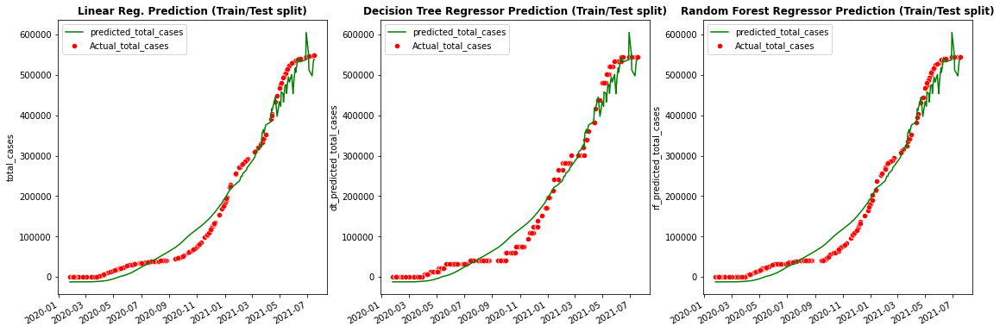

In [ ]:
gridspec.GridSpec(1,3)
plt.figure(figsize=(19,6.5))
plt.subplot2grid((1,3),(0,0))
sns.scatterplot(x= lin_model_pred_df.index, y=lin_model_pred_df['total_cases'], color='red', label='Actual_total_cases')
lin_model_pred_df['predicted_total_cases'].plot(color='green')
plt.title("Linear Reg. Prediction (Train/Test split)", fontdict={'fontweight':'bold'})
plt.legend()

plt.subplot2grid((1,3),(0,1))
sns.scatterplot(x= rf_lin_pred_df.index, y=rf_lin_pred_df['dt_predicted_total_cases'], color='red', label='Actual_total_cases')
lin_model_pred_df['predicted_total_cases'].plot(color='green')
plt.title("Decision Tree Regressor Prediction (Train/Test split)", fontdict={'fontweight':'bold'})
plt.legend()

plt.subplot2grid((1,3),(0,2))
sns.scatterplot(x= rf_lin_pred_df.index, y=rf_lin_pred_df['rf_predicted_total_cases'], color='red', label='Actual_total_cases')
lin_model_pred_df['predicted_total_cases'].plot(color='green')
plt.title("Random Forest Regressor Prediction (Train/Test split)", fontdict={'fontweight':'bold'})
plt.legend()

plt.show()


## Data Validation


**`Exploring KFold to validate models. First, linear models on two versions of the features and target variable`**

**`Note:`** Models defined above are recalled for training and prediction.



In [ ]:
# validating the model using multiple split versions of the data
# First, initialize KFold 

kf_select = KFold(n_splits=5, shuffle = True, random_state=1)

In [ ]:
# combine features and target_prediction into one df for split
kf_df = pd.concat([features, target_prediction], axis=1)
kf_df

,change_vaccinations,total_tests,total_cases
2020-01-25 00:00:00-05:00,0,0,1
2020-01-26 00:00:00-05:00,0,0,2
2020-01-27 00:00:00-05:00,0,0,2
2020-01-28 00:00:00-05:00,0,0,2
2020-01-29 00:00:00-05:00,0,0,2
...,...,...,...
2021-07-13 00:00:00-04:00,176834,16221898,547409
2021-07-14 00:00:00-04:00,179197,16250983,547562
2021-07-15 00:00:00-04:00,166201,16282312,547705
2021-07-16 00:00:00-04:00,168616,16310438,547864


In [ ]:
# use kf_select to create two subsets of the features df
set_1, set_2, set_3, set_4, set_5 = kf_select.split(kf_df)


In [ ]:
set_1

(array([  0,   1,   2,   3,   6,   7,   8,  10,  11,  12,  13,  14,  15,
         16,  18,  20,  21,  22,  23,  24,  25,  26,  27,  28,  30,  32,
         33,  35,  36,  37,  38,  39,  43,  44,  45,  46,  48,  49,  50,
         51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  63,  64,
         69,  70,  71,  72,  73,  74,  75,  76,  77,  79,  80,  81,  82,
         83,  84,  85,  86,  87,  88,  89,  91,  93,  94,  95,  96,  97,
         98,  99, 100, 101, 102, 103, 104, 105, 106, 108, 109, 110, 112,
        113, 114, 115, 116, 118, 120, 121, 122, 123, 124, 125, 126, 127,
        129, 130, 131, 134, 136, 137, 138, 139, 140, 141, 143, 144, 145,
        147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 161,
        163, 164, 166, 167, 168, 169, 170, 171, 172, 174, 175, 176, 177,
        178, 180, 181, 182, 183, 184, 186, 188, 190, 191, 192, 193, 194,
        195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207,
        208, 209, 210, 211, 212, 213, 215, 216, 217

In [ ]:
# creating the train and test features from subset_1 of the Kfold split

# train
kf_X_train_1 = kf_df.iloc[set_1[0], :-1]
kf_y_train_1  = kf_df.iloc[set_1[0], -1]

# test
kf_X_test_1  = kf_df.iloc[set_1[1], :-1]
kf_y_test_1  = kf_df.iloc[set_1[1], -1]


In [ ]:
# creating a kf_test_df
kf_test_df = pd.concat([kf_X_test_1, kf_y_test_1], axis=1)

In [ ]:
# training the model and measuring accuracy
result = model_tc.fit(kf_X_train_1, kf_y_train_1)
print(f"The accuracy score for set 1: {result.score(kf_X_train_1, kf_y_train_1)}\n\n")
print(f"The intercept for set 1 (lin_reg.): {result.intercept_}\n\n")
print(f"The slopes for for set 1 are: \nchange_vaccinations: {result.coef_[0]} \nchange_tests: {result.coef_[1]}")

The accuracy score for set 1: 0.9830775680037974


The intercept for set 1 (lin_reg.): -11660.203094918339


The slopes for for set 1 are: 
change_vaccinations: 0.8596611455619277 
change_tests: 0.025160265656436826


In [ ]:
# adding predicted total cases for subset1 as a column to kf_test_df
kf_test_df['pred_lin_set1'] = np.round(result.predict(kf_X_test_1)).astype(int)
kf_test_df.tail(7)

,change_vaccinations,total_tests,total_cases,pred_lin_set1
2021-06-04 00:00:00-04:00,168322,15341218,534675,519029
2021-06-20 00:00:00-04:00,184251,15676015,542198,541146
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504


In [ ]:
# working with subset 2:
# train data:
kf_X_train_2 = kf_df.iloc[set_2[0], :-1]
kf_y_train_2  = kf_df.iloc[set_2[0], -1]


# test data:
kf_X_test_2  = kf_df.iloc[set_2[1], :-1]


# training the model and measuring accuracy
result_2 = model_tc.fit(kf_X_train_2, kf_y_train_2)
print(f"The model score is: {result_2.score(kf_X_train_2, kf_y_train_2)}")

# adding predicted total cases as a column to kf_test_df
kf_test_df['pred_lin_set2'] = np.round(result_2.predict(kf_X_test_2)).astype(int)
kf_test_df.tail(7)


The model score is: 0.9811968255374794


,change_vaccinations,total_tests,total_cases,pred_lin_set1,pred_lin_set2
2021-06-04 00:00:00-04:00,168322,15341218,534675,519029,536755
2021-06-20 00:00:00-04:00,184251,15676015,542198,541146,573751
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732,592333
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951,556791
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647,540018
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130,500901
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504,538916


In [ ]:
# working with subset 3:
# train data:
kf_X_train_3 = kf_df.iloc[set_3[0], :-1]
kf_y_train_3  = kf_df.iloc[set_3[0], -1]


# test data:
kf_X_test_3  = kf_df.iloc[set_3[1], :-1]



# training the model and measuring accuracy
result_3 = model_tc.fit(kf_X_train_3, kf_y_train_3)
print(f"The model score is: {result_3.score(kf_X_train_3, kf_y_train_3)}")

# adding predicted total cases as a column to kf_test_df
kf_test_df['pred_lin_set3'] = np.round(result_3.predict(kf_X_test_3)).astype(int)
kf_test_df.tail(7)

The model score is: 0.9812002031564959


,change_vaccinations,total_tests,total_cases,pred_lin_set1,pred_lin_set2,pred_lin_set3
2021-06-04 00:00:00-04:00,168322,15341218,534675,519029,536755,622378
2021-06-20 00:00:00-04:00,184251,15676015,542198,541146,573751,517515
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732,592333,580041
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951,556791,626363
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647,540018,589612
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130,500901,545147
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504,538916,545568


In [ ]:
# working with subset 4:
# train data:
kf_X_train_4 = kf_df.iloc[set_4[0], :-1]
kf_y_train_4  = kf_df.iloc[set_4[0], -1]


# test data:
kf_X_test_4  = kf_df.iloc[set_4[1], :-1]



# training the model and measuring accuracy
result_4 = model_tc.fit(kf_X_train_4, kf_y_train_4)
print(f"The model score is: {result_4.score(kf_X_train_4, kf_y_train_4)}")

# adding predicted total cases as a column to kf_test_df
kf_test_df['pred_lin_set4'] = np.round(result_4.predict(kf_X_test_4)).astype(int)
kf_test_df.tail(7)

The model score is: 0.9820717178337057


,change_vaccinations,total_tests,total_cases,pred_lin_set1,pred_lin_set2,pred_lin_set3,pred_lin_set4
2021-06-04 00:00:00-04:00,168322,15341218,534675,519029,536755,622378,485949
2021-06-20 00:00:00-04:00,184251,15676015,542198,541146,573751,517515,483372
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732,592333,580041,475453
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951,556791,626363,537217
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647,540018,589612,560235
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130,500901,545147,615445
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504,538916,545568,549727


In [ ]:
# working with subset 5:
# train data:
kf_X_train_5 = kf_df.iloc[set_5[0], :-1]
kf_y_train_5  = kf_df.iloc[set_5[0], -1]


# test data:
kf_X_test_5  = kf_df.iloc[set_5[1], :-1]



# training the model and measuring accuracy
result_5 = model_tc.fit(kf_X_train_5, kf_y_train_5)
print(f"The model score is: {result_5.score(kf_X_train_5, kf_y_train_5)}")

# adding predicted total cases as a column to kf_test_df
kf_test_df['pred_lin_set5'] = np.round(result_5.predict(kf_X_test_5)).astype(int)
kf_test_df.tail(7)

The model score is: 0.9822749927724558


,change_vaccinations,total_tests,total_cases,pred_lin_set1,pred_lin_set2,pred_lin_set3,pred_lin_set4,pred_lin_set5
2021-06-04 00:00:00-04:00,168322,15341218,534675,519029,536755,622378,485949,552735
2021-06-20 00:00:00-04:00,184251,15676015,542198,541146,573751,517515,483372,561232
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732,592333,580041,475453,486686
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951,556791,626363,537217,576984
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647,540018,589612,560235,559853
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130,500901,545147,615445,569836
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504,538916,545568,549727,570582


In [ ]:
# assessing actual cases vs predicted cases using accuracy and error metrics
print("KFold cross validation of Linear Regression model with 5 shuffled splits of the data: \n\n")
# set 1:
print(f"For set 1, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['pred_lin_set1']):.4f}")
print(f"For set 1, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set1']):.2f}")
print(f"For set 1, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set1']):.2f} \n\n")

# set 2:
print(f"For set 2, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['pred_lin_set2']):.4f}")
print(f"For set 2, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set2']):.2f}")
print(f"For set 2, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set2']):.2f} \n\n")

# set 3:
print(f"For set 3, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['pred_lin_set3']):.4f}")
print(f"For set 3, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set3']):.2f}")
print(f"For set 3, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set3']):.2f} \n\n")

# set 4:
print(f"For set 4, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['pred_lin_set4']):.4f}")
print(f"For set 4, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set4']):.2f}")
print(f"For set 4, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set4']):.2f} \n\n")

# set 5:
print(f"For set 5, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['pred_lin_set5']):.4f}")
print(f"For set 5, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set5']):.2f}")
print(f"For set 5, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set5']):.2f} \n\n")

KFold cross validation of Linear Regression model with 5 shuffled splits of the data: 


For set 1, the measure of accuracy for the model using r-squared is: 0.9768
For set 1, the mean absolute error for the model is: 21833.98
For set 1, the mean squared error for the model is: 736426645.13 


For set 2, the measure of accuracy for the model using r-squared is: 0.9643
For set 2, the mean absolute error for the model is: 25993.56
For set 2, the mean squared error for the model is: 1131357660.15 


For set 3, the measure of accuracy for the model using r-squared is: 0.9450
For set 3, the mean absolute error for the model is: 26637.72
For set 3, the mean squared error for the model is: 1744564424.00 


For set 4, the measure of accuracy for the model using r-squared is: 0.9612
For set 4, the mean absolute error for the model is: 24985.19
For set 4, the mean squared error for the model is: 1232088061.27 


For set 5, the measure of accuracy for the model using r-squared is: 0.9715
For set 

**`Observation:`**
- The `set_1`, derived from a KFold split, made better predictions with a higher accuracy score than the other sets from the kfold split.  

- Mathematically, for set_1: 
  
    **`total_cases = -11660.203 + (0.860 * change_vaccinations) +  (0.025 * total_tests)`**

<br>

- X and y from `set 1` are used in other models 


In [ ]:
# training and testing the kfold sets using the decision tree regressor model above
kf_dt_result = dt_model.fit(kf_X_train_1, kf_y_train_1)

print(f"The model score is: {kf_dt_result.score(kf_X_train_1, kf_y_train_1)}")

# adding predicted total cases as a column to kf_test_df
kf_test_df['dt_pred_set1'] = np.round(kf_dt_result.predict(kf_X_test_1)).astype(int)
kf_test_df.tail()

The model score is: 0.9994921126373008


,change_vaccinations,total_tests,total_cases,pred_lin_set1,pred_lin_set2,pred_lin_set3,pred_lin_set4,pred_lin_set5,dt_pred_set1
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732,592333,580041,475453,486686,544073
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951,556791,626363,537217,576984,544073
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647,540018,589612,560235,559853,544073
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130,500901,545147,615445,569836,544073
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504,538916,545568,549727,570582,544073


In [ ]:
# training and testing the kfold sets using the random forest regressor model above
kf_rf_result = rf_model.fit(kf_X_train_1, kf_y_train_1)

print(f"The model score is: {kf_rf_result.score(kf_X_train_1, kf_y_train_1)}")
# adding predicted total cases as a column to kf_test_df
kf_test_df['rf_pred_set1'] = np.round(kf_rf_result.predict(kf_X_test_1)).astype(int)
kf_test_df.tail(10)

The model score is: 0.9999315104390605


,change_vaccinations,total_tests,total_cases,pred_lin_set1,pred_lin_set2,pred_lin_set3,pred_lin_set4,pred_lin_set5,dt_pred_set1,rf_pred_set1
2021-05-21 00:00:00-04:00,158524,14938913,518980,500484,509783,567727,412989,456352,516983,518942
2021-05-24 00:00:00-04:00,99108,15024867,523911,451569,476565,557823,479361,522179,516983,524046
2021-05-25 00:00:00-04:00,86927,15041724,524950,441521,526856,545513,487155,548304,532850,526688
2021-06-04 00:00:00-04:00,168322,15341218,534675,519029,536755,622378,485949,552735,532850,534816
2021-06-20 00:00:00-04:00,184251,15676015,542198,541146,573751,517515,483372,561232,544073,542777
2021-06-26 00:00:00-04:00,256260,15862123,543917,607732,592333,580041,475453,486686,544073,544831
2021-06-29 00:00:00-04:00,265231,15922024,544713,616951,556791,626363,537217,576984,544073,544831
2021-07-05 00:00:00-04:00,144795,16050390,545973,516647,540018,589612,560235,559853,544073,544879
2021-07-07 00:00:00-04:00,204594,16093172,546411,569130,500901,545147,615445,569836,544073,544879
2021-07-13 00:00:00-04:00,176834,16221898,547409,548504,538916,545568,549727,570582,544073,544879


In [ ]:
# model metric for on set 1: Linear regression, 
print("Linear Regression:\n")
print(f"For set 1, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['pred_lin_set1']):.4f}")
print(f"For set 1, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set1']):.2f}")
print(f"For set 1, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['pred_lin_set1']):.2f} \n\n")

print("Decision Tree Regressor:\n")
print(f"For set 1, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['dt_pred_set1']):.4f}")
print(f"For set 1, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['dt_pred_set1']):.2f}")
print(f"For set 1, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['dt_pred_set1']):.2f} \n\n")

print("Random Forest Regressor:\n")
print(f"For set 1, the measure of accuracy for the model using r-squared is: {r2_score(kf_test_df['total_cases'], kf_test_df['rf_pred_set1']):.4f}")
print(f"For set 1, the mean absolute error for the model is: {mean_absolute_error(kf_test_df['total_cases'], kf_test_df['rf_pred_set1']):.2f}")
print(f"For set 1, the mean squared error for the model is: {mean_squared_error(kf_test_df['total_cases'], kf_test_df['rf_pred_set1']):.2f} \n\n")


Linear Regression:

For set 1, the measure of accuracy for the model using r-squared is: 0.9768
For set 1, the mean absolute error for the model is: 21833.98
For set 1, the mean squared error for the model is: 736426645.13 


Decision Tree Regressor:

For set 1, the measure of accuracy for the model using r-squared is: 0.9991
For set 1, the mean absolute error for the model is: 3959.11
For set 1, the mean squared error for the model is: 28213548.59 


Random Forest Regressor:

For set 1, the measure of accuracy for the model using r-squared is: 0.9998
For set 1, the mean absolute error for the model is: 1601.43
For set 1, the mean squared error for the model is: 5482411.00 




### **`Conclusions`**
- A 5-set kfold split was done to derive 5 distinct arrangements of a dataframe containing a prediction traget and predictors.
- Testing on a linear regression model,`set_1`, derived from the split, made the best predictions of the 5. 

- Mathematically, for set_1: 
  
    **`total_cases = -11660.203 + (0.860 * change_vaccinations) +  (0.025 * total_tests)`**

- Others models were explored using only X and y from `set 1` 

- The linear regression model has an accuracy score of approximately 0.9771 

- With the decision tree regressor, the prediction accuracy score (r-squared) improved from what was observed with linear regression to ~ 0.9991

- This even got better with the random forest regressor model, where the r-squared score was computed as ~ 0.9998. 

- In both decision tree and random forest regressors, the errors metrices with set_1 are lower than what was observed with the train_test_split data.

- However, random forest model made predictions with the least amount of errors across the 3 models and is recommended.

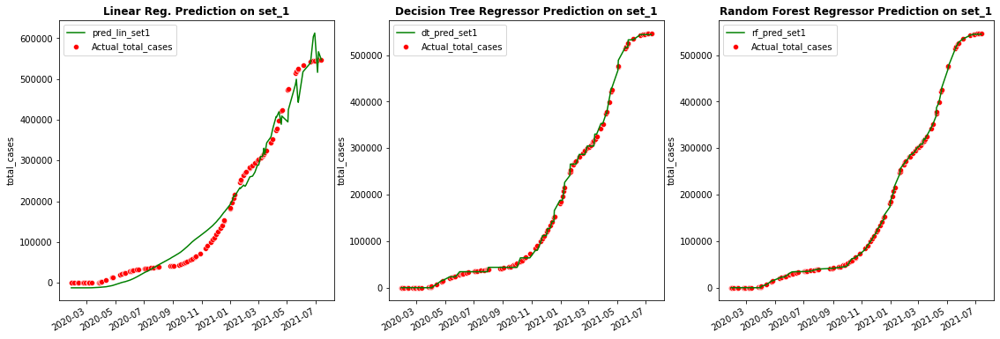

In [ ]:
gridspec.GridSpec(1,3)
plt.figure(figsize=(19,6.5))
plt.subplot2grid((1,3),(0,0))
sns.scatterplot(x= kf_test_df.index, y=kf_test_df['total_cases'], color='red', label='Actual_total_cases')
kf_test_df['pred_lin_set1'].plot(color='green')
plt.title("Linear Reg. Prediction on set_1", fontdict={'fontweight':'bold'})
plt.legend()

plt.subplot2grid((1,3),(0,1))
sns.scatterplot(x= kf_test_df.index, y=kf_test_df['total_cases'], color='red', label='Actual_total_cases')
kf_test_df['dt_pred_set1'].plot(color='green')
plt.title("Decision Tree Regressor Prediction on set_1", fontdict={'fontweight':'bold'})
plt.legend()

plt.subplot2grid((1,3),(0,2))
sns.scatterplot(x= kf_test_df.index, y=kf_test_df['total_cases'], color='red', label='Actual_total_cases')
kf_test_df['rf_pred_set1'].plot(color='green')
plt.title("Random Forest Regressor Prediction on set_1", fontdict={'fontweight':'bold'})
plt.legend()

plt.show()
